# Assignment 2 EMNIST Handwritten Character Classification

**The EMNIST Dataset**

**What is it?**

The EMNIST dataset is a set of handwritten character digits derived from the NIST Special Database 19  and converted to a 28x28 pixel image format and dataset structure that directly matches the MNIST dataset . Further information on the dataset contents and conversion process can be found in the paper available at https://arxiv.org/abs/1702.05373v1.

**Formats**

The dataset is provided in two file formats. Both versions of the dataset contain identical information, and are provided entirely for the sake of convenience. The first dataset is provided in a Matlab format that is accessible through both Matlab and Python (using the scipy.io.loadmat function). The second version of the dataset is provided in the same binary format as the original MNIST dataset as outlined in http://yann.lecun.com/exdb/mnist/

**Dataset Summary**

There are six different splits provided in this dataset. A short summary of the dataset is provided below:

*EMNIST ByClass*: 814,255 characters. 62 unbalanced classes.
*EMNIST ByMerge*: 814,255 characters. 47 unbalanced classes.
*EMNIST Balanced*:  131,600 characters. 47 balanced classes.
*EMNIST Letters*: 145,600 characters. 26 balanced classes.
*EMNIST Digits*: 280,000 characters. 10 balanced classes.
*EMNIST MNIST*: 70,000 characters. 10 balanced classes.

The full complement of the NIST Special Database 19 is available in the ByClass and ByMerge splits. The EMNIST Balanced dataset contains a set of characters with an equal number of samples per class. The EMNIST Letters dataset merges a balanced set of the uppercase and lowercase letters into a single 26-class task. The EMNIST Digits and EMNIST MNIST dataset provide balanced handwritten digit datasets directly compatible with the original MNIST dataset.

# Part 1. Model Training

## Setup

### Libraries and modules

In [ ]:
# Load the libraries
import time # A library to do operations with system time
import pickle # A library for opening the .pkl file
import numpy as np
import pandas as pd
import matplotlib # To check its version later
import matplotlib.pyplot as plt # One plotting library
import seaborn as sns # Another plotting library
from PIL import Image
import torch # PyTorch instead of Keras or TensorFlow
# Import some useful modules in PyTorch
import torch.nn.functional as F
from torch import nn, optim
from torch.nn import init
from torch.nn.utils import clip_grad_norm_
from torch.utils.data import TensorDataset, Dataset, DataLoader
from torchvision import datasets, transforms
from torchvision.transforms.functional import rotate
from tqdm import tqdm # A library to track the training epochs using the progress bar
import sklearn # To check its version later
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix # Some metrics from Sci-kit Learn to measure the performance of a classifier
from sklearn.model_selection import train_test_split, ParameterSampler
import warnings
warnings.filterwarnings('ignore') # Avoid warnings caused by libraries' version conflicts
%matplotlib inline

# Global variables
# Directory of files
dir = '/content/drive/MyDrive/5318-Assignment-2/' # Might need to change the directory on another machine
# Folder name
folder = 'EMNIST_Byclass_Small/'
# Define target device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu') # Training our models with GPU acceleration
print(f"We are using {device}.")

We are using cuda.


In [ ]:
# To authorise access of Google Drive
from google.colab import drive
drive.mount('/content/drive')
# Because we run this code in Google Colab environment, we need to authorize the access.
# If you run your code in your local environment, you can skip this snippet.

Mounted at /content/drive


### Hardware specifications

#### CPU Info

In [ ]:
# Check CPU information
!cat /proc/cpuinfo

processor	: 0
vendor_id	: GenuineIntel
cpu family	: 6
model		: 79
model name	: Intel(R) Xeon(R) CPU @ 2.20GHz
stepping	: 0
microcode	: 0xffffffff
cpu MHz		: 2199.998
cache size	: 56320 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_single ssbd ibrs ibpb stibp fsgsbase tsc_adjust bmi1 hle avx2 smep bmi2 erms invpcid rtm rdseed adx smap xsaveopt arat md_clear arch_capabilities
bugs		: cpu_meltdown spectre_v1 spectre_v2 spec_store_bypass l1tf mds swapgs taa mmio_stale_data retbleed
bogomips	: 4399.99
clflush size	: 64
cache_alignment	: 64
addres

#### GPU Info

In [ ]:
# Check GPU information
!nvidia-smi

Fri May  5 08:16:40 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### Software specifications

In [ ]:
# Information of packages' version
print("Main Packages' version:")
print(f"NumPy version: {np.__version__};")
print(f"Matplotlib version: {matplotlib.__version__};")
print(f"Seaborn version: {sns.__version__};")
print(f"PyTorch version: {torch.__version__};")
print(f"Sci-kit Learn version: {sklearn.__version__}.")

Main Packages' version:
NumPy version: 1.22.4;
Matplotlib version: 3.7.1;
Seaborn version: 0.12.2;
PyTorch version: 2.0.0+cu118;
Sci-kit Learn version: 1.2.2.


## Datasets

### Complete datasets

#### Compute the normalisation of EMNIST ByClass

In [ ]:
# Load the whole dataset
emnist_dataset = datasets.EMNIST(root='./EMNIST', split='byclass', download=True, transform=transforms.ToTensor())

# Initialise the values of the mean and the standard deviation of all of the images
mean = 0.0
std = 0.0

# Compute the mean and stardard deviation in order to normalise the images later
for image, _ in emnist_dataset:
    mean += image.mean()
    std += image.std()

mean /= len(emnist_dataset)
std /= len(emnist_dataset)
print("EMNIST Mean: ", mean)
print("EMNIST Std: ", std)

100%|██████████| 561753746/561753746 [00:03<00:00, 141245233.84it/s]


Extracting ./EMNIST/EMNIST/raw/gzip.zip to ./EMNIST/EMNIST/raw
EMNIST Mean:  tensor(0.1736)
EMNIST Std:  tensor(0.3248)


#### Load the complete dataset from PyTorch

In [ ]:
# Define the transformation of the images
transform = transforms.Compose([transforms.Resize(28),
                                transforms.ToTensor(),
                                transforms.Normalize((mean,), (std,)),
                                transforms.Lambda(lambda img: rotate(img, 90))
                                ])
# Load the EMNIST dataset
emnist_train_complete = datasets.EMNIST(root='./EMNIST',split='byclass', train=True, download=True, transform=transform)
emnist_test_complete = datasets.EMNIST(root='./EMNIST', split='byclass', train=False, download=True, transform=transform)

100%|██████████| 561753746/561753746 [01:42<00:00, 5460809.18it/s]


Extracting ./EMNIST/EMNIST/raw/gzip.zip to ./EMNIST/EMNIST/raw


#### Overview of the complete dataset

In [ ]:
# Check if datasets loaded successfully
num_character = len(emnist_train_complete) + len(emnist_test_complete)
num_classes = len(emnist_train_complete.classes)

# Print the overview of the complete EMNIST datasets
print(f"EMNIST ByClass: {num_character:,} characters. {num_classes} unbalanced classes.")

EMNIST ByClass: 814,255 characters. 62 unbalanced classes.


### Datasets for Sci-kit Learn

#### Load the dataset from .pkl file

In [ ]:
# Normalisation parameters computed based on the complete EMNIST dataset
# To avoid loading the entire dataset and computing these values each time, we simply record them.
mean, std = 0.1736, 0.3248

# Assign filenames to variables
train_file = 'emnist_train.pkl'
test_file = 'emnist_test.pkl'

# Open the files from the directory and load the dataset
with open(dir + folder + train_file, 'rb') as train:
  train_set = pickle.load(train)
with open(dir + folder + test_file, 'rb') as test:
  test_set = pickle.load(test)

# Split the dataset into features and labels
# Because we might split the training set into training and validation sets, we call it the raw training dataset here.
X_train_raw = train_set['data']
y_train_raw = train_set['labels']
X_test = test_set['data']
y_test = test_set['labels']

#### Overview of the dataset EMNIST ByClass Small

In [ ]:
def check_size():
  '''Check if all of the images have the same size.'''
  total = 0
  for img in X_train_raw:
    shape = X_train_raw[0].shape
    if img.shape != shape:
      # If any image has different size, it will be counted.
      total += 1
  if total == 0:
    # If all of the images have the same size, 28 * 28, this line will be printed.
    print(f"The size of each image: {shape[0]} pixels * {shape[1]} pixels.")

# Display the overview of the EMNIST ByClass Small dataset
# Total number of images, including training and test sets.
num_characters = len(y_train_raw) + len(y_test)
num_classes = len(np.unique(y_train_raw))
print(f"EMNIST ByClass Small: {num_characters:,} characters. {num_classes} unbalanced classes.", end=" ")
check_size()

EMNIST ByClass Small: 120,000 characters. 62 unbalanced classes. The size of each image: 28 pixels * 28 pixels.


#### Create a EMNIST ByClass Mini for hyperparameter tuning

In [ ]:
def mini_set(X, y, test_size=0.1, random_state=42):
  '''Extract a smaller dataset for hyperparameter tuning'''
  """Parameters:
      X, corresponds to the features;
      y, corresponds to the labels;
      test_size, correponds to the proportion of the smaller set, Defaut: 0.1;
      random_state, correponds to the random seed, Default: 42, 42 is presented as 'the ultimate answer to life, the universe, and everything'.

      Returns:
      X_train, corresponds to the inputs of the training set;
      X_mini,  corresponds to the inputs of a mini subset from the original dataset;
      y_train, corresponds to the labels of the training set;
      y_mini,  corresponds to the labels of a mini subset from the original dataset;
  """
  # Use train_test_split() function for simplified implement
  X_train, X_mini, y_train, y_mini = train_test_split(X, y, test_size=test_size,
                                                      random_state=random_state, stratify=y)
  return X_train, X_mini, y_train, y_mini

# Extract 90% of images as the training inputs, and 10% as the validatation set for hyperparameter tuning.
X_train, X_mini, y_train, y_mini = mini_set(X_train_raw, y_train_raw)
X_mini_train, X_mini_val, y_mini_train, y_mini_val = train_test_split(X_mini, y_mini, test_size=0.2, stratify=y_mini)

### Datasets for PyTorch

#### Convert data from NumPy ndarray to PyTorch tensor

In [ ]:
# Convert all of the targets to Tensor type
y_train_raw_tensor = torch.from_numpy(y_train_raw)
y_train_tensor = torch.from_numpy(y_train)
y_mini_tensor = torch.from_numpy(y_mini)
y_test_tensor = torch.from_numpy(y_test)
y_mini_train_tensor = torch.from_numpy(y_mini_train)
y_mini_val_tensor = torch.from_numpy(y_mini_val)

In [ ]:
# Convert ndarray dataset to PyTorch dataset, so that we can some transformation
class ImageDataset(Dataset):
  def __init__(self, images, labels):
    self.images = images
    self.labels = labels
    # Define the transformation of images
    self.transform = transforms.Compose([transforms.ToTensor(),transforms.Normalize((mean,), (std,))])

  def __len__(self):
    return len(self.images)

  def __getitem__(self, idx):
    img = self.images[idx]
    lab = self.labels[idx]
    # Normalise the image
    img = self.transform(img)
    return img, lab

# To begin with, we convert the data type from ndarray to images.
image_train_raw = [Image.fromarray(ndarray, mode='L') for ndarray in X_train_raw]
image_train = [Image.fromarray(ndarray, mode='L') for ndarray in X_train]
image_test = [Image.fromarray(ndarray, mode='L') for ndarray in X_test]
image_mini = [Image.fromarray(ndarray, mode='L') for ndarray in X_mini]
image_mini_train = [Image.fromarray(ndarray, mode='L') for ndarray in X_mini_train]
image_mini_val = [Image.fromarray(ndarray, mode='L') for ndarray in X_mini_val]

# Store images and labels in a tensor format in Dataset
emnist_raw = ImageDataset(image_train_raw, y_train_raw_tensor)
emnist_train = ImageDataset(image_train, y_train_tensor)
emnist_test = ImageDataset(image_test, y_test_tensor)
emnist_mini = ImageDataset(image_mini, y_mini_tensor)
emnist_mini_train = ImageDataset(image_mini_train, y_mini_train_tensor)
emnist_mini_val = ImageDataset(image_mini_val, y_mini_val_tensor)

#### Augmentation techniques

In [ ]:
# Construct a different PyTorch dataset for data augmentation
class AugmentDataset(Dataset):
  def __init__(self, images, labels, augment):
    self.images = images
    self.labels = labels
    # Define the data augmentation of images
    self.transform = augment

  def __len__(self):
    return len(self.images)

  def __getitem__(self, idx):
    img = self.images[idx]
    lab = self.labels[idx]
    if self.transform:
      img = self.transform(img)
    return img, lab

# A combinition of five data augmentation techniques, including rotation, shearing, shifting up and down, zooming, and rescale
augment = transforms.Compose([
    transforms.RandomAffine(degrees=15, translate=(0.1, 0.1), scale=(0.9, 1.1), shear=3),
    transforms.ToTensor(),
    transforms.Normalize((mean, ), (std, ))
    ])

# Datasets which have been augmented will be regarded as the training inputs
emnist_raw_augment = AugmentDataset(image_train_raw, y_train_raw_tensor, augment)
emnist_augment = AugmentDataset(image_train, y_train_tensor, augment)
emnist_augment_mini = AugmentDataset(image_mini, y_mini_tensor, augment)

### Dataset visualisation

#### Before augmentation

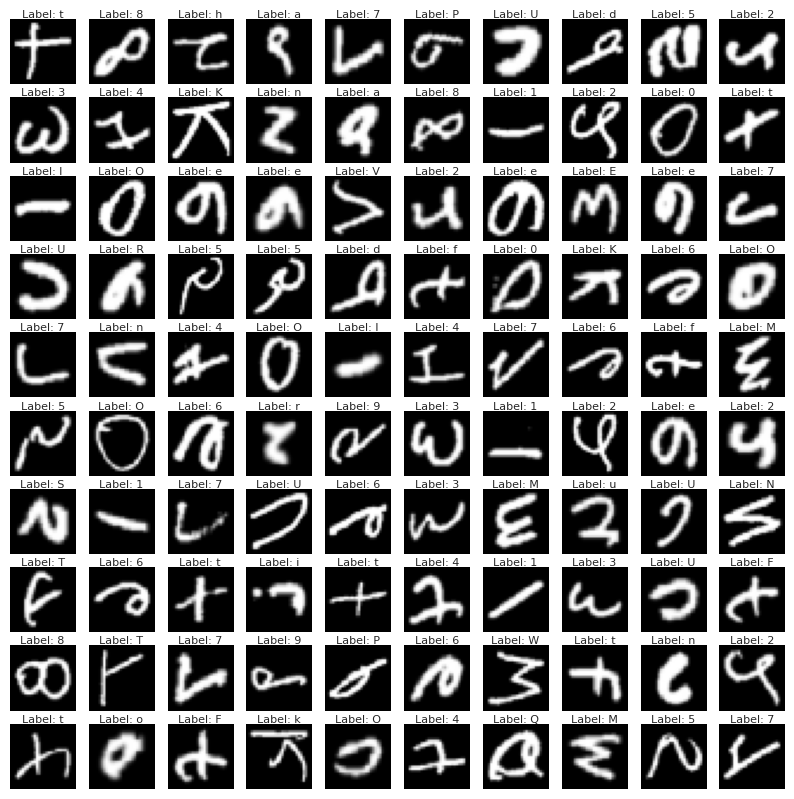

In [ ]:
# Display several images based on our dataset
rows, cols = 10, 10
num_display = rows * cols
label_map = "0123456789ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz"
indices = torch.randperm(len(emnist_train))[:num_display]
fig, axes = plt.subplots(rows, cols, figsize=(10, 10))
for idx, ax in zip(indices, axes.flatten()):
    image, label = emnist_train[idx]
    image_np = image.squeeze(0).numpy()
    ax.imshow(image_np, cmap='gray')
    ax.set_title(f'Label: {label_map[label]}', fontsize=8, y=.9)
    ax.axis('off')
plt.show()

#### After augmentation

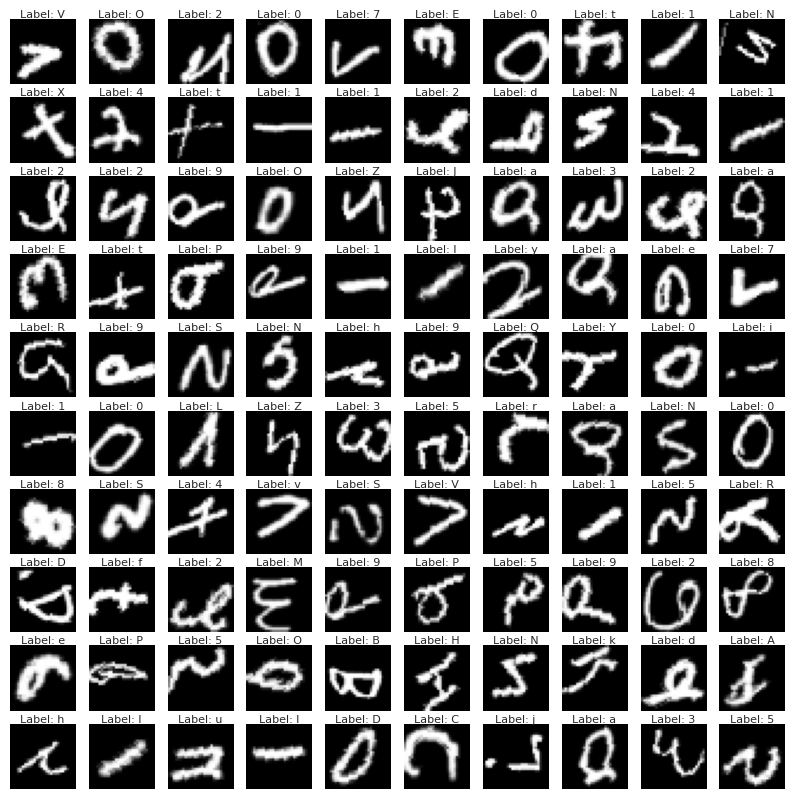

In [ ]:
# Display several images based on our dataset
rows, cols = 10, 10
num_display = rows * cols
label_map = "0123456789ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz"
indices = torch.randperm(len(emnist_augment))[:num_display]
fig, axes = plt.subplots(rows, cols, figsize=(10, 10))
for idx, ax in zip(indices, axes.flatten()):
    image, label = emnist_augment[idx]
    image_np = image.squeeze(0).numpy()
    ax.imshow(image_np, cmap='gray')
    ax.set_title(f'Label: {label_map[label]}', fontsize=8, y=.9)
    ax.axis('off')
plt.show()

## Preparation for training models

### Detailed network structure

In [ ]:
def network_structure(model):
  '''Analyzing the Architecture of Neural Networks:'''
  '''Including: the number of fully Connected and convolutional layers, and the number of parameters of Each Layer.'''
  """Parameter:
      model, corresponds to a certain neural network.
  """
  i, j = 0, 0
  print("Model layers:")
  for name, layer in model.named_modules():
    if name:
      if "shortcut" in name:  # Check if the layer is a shortcut in ResNet
        continue
      if isinstance(layer, nn.Conv2d):
        i += 1
        print(f"Layer {i + j} (Convolutional Layer {i}): {layer}")
      elif isinstance(layer, nn.Linear):
        j += 1
        print(f"Layer {i + j} (Fully-connected Layer {j}): {layer}")
  print(f"Summary: There are {i} convoluitonal layers and {j} fully-connected layers.")

### Training epochs

In [ ]:
def hr_min_sec(second):
  '''Convert the training time from the format of seconds to the format of hours, minutes and seconds'''
  """Parameter:
      second, corresponds to the training time in second format.
  """
  if second > 3600:
    hr = int(second // 3600)
    min = int((second - hr * 3600) // 60)
    sec = second % 60
    print(f"Training procedure running time: {hr} hour(s), {min} minute(s), and {sec:.2f} second(s).")
  elif second > 60:
    min = int(second // 60)
    sec = second % 60
    print(f"Training procedure running time: {min} minute(s), and {sec:.2f} second(s).")
  else:
    sec = second % 60
    print(f"Training procedure running time: {sec:.2f} second(s).")

In [ ]:
# Define the metrics during the training epochs
def topk_accuracy(output, target, topk=(1,)):
  '''The percentage of times a model's top k predicted labels include the correct label for a given image.'''
  """Parameters:
      output, corresponds to the predicted labels;
      target, corresponds to the true labels;
      topk, corresponds to the top k, Default: (1, ).

      Return:
      res, a list of top k accuracy values.
      For exmaple, if we pass to (1, 3, 5) to topk, it will return a list,
      the first element indicates the top-1 accuracy, the second element indicates the top-3 accuracy, the third element indicates the top-5 accuracy.
  """
  maxk = max(topk)
  batch_size = target.size(0)

  _, pred = output.topk(maxk, 1, True, True)
  pred = pred.t()
  correct = pred.eq(target.view(1, -1).expand_as(pred))

  res = []
  for k in topk:
      correct_k = correct[:k].view(-1).float().sum(0)
      res.append(correct_k.mul_(100.0/batch_size))
  return res

# We will mainly use this accuracy in our experiments.
def accuracy(output, target):
  '''Describe the accuracy'''
  """Parameters:
      output, corresponds to the prediction of a neural network based on a batch of samples;
      target, corresponds to the ground truth of a batch of samples.

      Return:
      res, corresponds to the accuracy value of the output and the target.
  """
  batch_size = target.size(0)
  _, pred = output.topk(1, 1, True, True)
  pred = pred.t()
  correct = pred.eq(target.view(1, -1).expand_as(pred))
  correct_1 = correct[:1].view(-1).float().sum(0)
  res = correct_1.mul_(100.0 / batch_size)
  return res

In [ ]:
def train(model, train_loader, valid_loader, optimizer, criterion, epochs=20, clip_value=1.0, early_stop_threshold=10):
  '''Training epochs, which can track some metrics for visualisation'''
  """Parameters:
      model, corresponds to a specific model;
      train_loader, corresponds to a PyTorch DataLoader containing training inputs and targets;
      valid_loader, corresponds to a PyTorch DataLoader containing validation inputs and targets, which we will apply early stopping based on this;
      optimizer, corresponds to a PyTorch Optimizer which is usually SGD or Adam in our case;
      criterion, corresponds to a PyTorch Loss Function we need to optimise. In our context, it should be because it is a multiclass classification task;
      epochs, corresponds to the number of training epochs, Default: 20;
      clip_value, correponds to a threshold to avoid gradient explosion, Default: 0.1;
      early_stop_threshold, corresponds to a threshold to determinte when to stop the training procedure, Default: 10.
  """
  # Intialise a list to store the loss value of the training set in each epoch
  loss_list = []
  # Intialise a list to store the accuracy value of the validation set in each epoch
  acc_list = []
  # Initialise a list to store the loss value of the training set in each epoch
  valid_loss_list = [np.inf] # Start with a high validation loss
  # Initialise a list to store the accuracy value of the validation set in each epoch
  valid_acc_list = []
  # Initialise a early stopping counter to determine when the training procedure stops
  early_stop_counter = 0
  model.train()

  # Record the begining time in order to record the entire trainig time
  start_time = time.time()
  for ep in tqdm(range(epochs)):
    # Initialise the training loss and the accuracy values at the beginning of each epoch
    ep_loss = 0.0
    ep_acc = 0.0
    for step, (x, y) in enumerate(train_loader):
      # Do GPU computation for acceleration
      if torch.cuda.is_available():
        # Change the data type for PyTorch computation
        x = x.float().to(device)
        y = y.to(device)
      # Clear the gradient
      optimizer.zero_grad()
      # Compute the outputs of a batch of inputs
      p = model(x)
      # Compute the loss value based on outputs and targets
      loss = criterion(p, y)
      # Compute the accuracy value based on outputs and targets using the function we defined before
      acc = accuracy(p, y)
      # Record cross entropy loss in each epoch
      ep_loss += loss.item()
      # Record accuracy in each epoch
      ep_acc += acc.item()
      loss.backward() # Backpropagation
      clip_grad_norm_(model.parameters(), clip_value) # To avoid gradient exploding
      optimizer.step() # Upgrade gradients
    # Record the loss and accuracy values
    loss_list.append(ep_loss/(step+1))
    acc_list.append(ep_acc/(step+1))

    # Early stopping
    # Set the model to the evaluation state
    model.eval()
    valid_loss = 0.0
    valid_acc = 0.0
    with torch.no_grad():
      # Similar steps in the core training procedure
      for x, y in valid_loader:
        if torch.cuda.is_available():
          x = x.float().to(device)
          y = y.to(device)
        p = model(x)
        loss = criterion(p, y)
        acc = accuracy(p, y)
        # Accumulate the loss values and accuracy values
        valid_loss += loss.item()
        valid_acc += acc.item()
    # Early stopping condition
    if valid_loss/len(valid_loader) < valid_loss_list[-1]:
      early_stop_counter = 0
    else:
      early_stop_counter += 1

    valid_loss_list.append(valid_loss/len(valid_loader))
    valid_acc_list.append(valid_acc/len(valid_loader))
    model.train()
    # Print it if the early stopping works
    if early_stop_counter >= early_stop_threshold:
      print("\nModel training finished due to early stopping.")
      break

  # Record the end time
  end_time = time.time()
  # Compute the training time based on the beginning time and the end time
  training_time = end_time - start_time
  print()
  # Convert the time format for readability
  hr_min_sec(training_time)
  # Visualise the metrics after training
  fig, axs = plt.subplots(1, 2, figsize=(12, 4))
  # Visualise the cross entropy loss curve
  axs[0].plot(loss_list, color='red', label='Training Loss')
  axs[0].set_xlabel('Epochs')
  axs[0].set_ylabel('Loss')
  axs[0].set_title('Loss during Training')
  axs[0].legend(loc='best')
  # Visualise the accuracy curve
  axs[1].plot(acc_list, color=(1.0, 0.5, 0.0), label='Training Accuracy')
  axs[1].set_xlabel('Epochs')
  axs[1].set_ylabel('Accuracy')
  axs[1].set_title('Accuracy during Training')
  axs[1].legend(loc='best')
  plt.show()

### Hyperparameter optimisation

Algorithm: Random search

In [ ]:
# Define a general hyperparameter search space for most of our models, expect for ResNet
param_grid = {
    'learning_rate': [1e-3, 1e-2, 1e-1], # Learning rate, one of the most important hyperparameters in machine learning and deep learning;
    'batch_size': [16, 32, 64], # Batch size, another crucial hyperparameter related to tranining efficiency and quality;
    'momentum': [0, 0.85, 0.9, 0.95], # Momentum, a hyperparameter of SGD, which is used to accelerate the convergence speed;
    'weight_decay': [0, 1e-2, 1e-3, 1e-4] # Weight decay, a hyperparameter for L2 regularization to avoid overfitting.
}

def train_and_evaluate(model, optimizer, criterion, train_loader, val_loader, num_epochs):
  '''Compute the validation loss during the training epochs'''
  """Parameters:
      model, corresponds to a specific classifier;
      optimizer, corresponds to a PyTorch optimizer, typically SGD and Adam;
      criterion, corresponds to Cross Entropy Loss in our context;
      train_loader, corresponds to a PyTorch DataLoader containing training inputs and labels;
      valid_loader, corresponds to a PyTorch DataLoader containing validation inputs and labels;
      num_epochs, correspond to the number of training epochs.

      Return:
      val_loss, the loss value on the validation set durining the specific training procedure.
  """
  # Switch the model to the training state
  model.train()
  # Train model for several epochs
  for epoch in range(num_epochs):
    for inputs, targets in train_loader:
      optimizer.zero_grad()
      outputs = model(inputs)
      loss = criterion(outputs, targets)
      loss.backward()
      optimizer.step()

  # Switch the model to the evaluation state
  model.eval()
  # Compute the loss value on the validation set
  val_loss = 0
  with torch.no_grad():
    for inputs, targets in val_loader:
      outputs = model(inputs)
      loss = criterion(outputs, targets)
      val_loss += loss.item()

  val_loss /= len(val_loader)
  return val_loss

def random_search(model_class, param_grid, n_iter=28, num_epochs=5):
  '''Random search algorithm to find the locally optimal combination of hyperparameters.'''
  """Parameters:
      model_class, corresponds to a specific model class, instead of a initialised model;
      param_grid, corresponds to the hyperparameter search space;
      n_iter, corresponds to the number of iterations for hyperparameter tuning, Default: 28 because it is 20% of the size of our general hyperparameter search space;
      num_epochs, correponds to the number of training epochs, Default: 5. For hyperparameter tuning, 20 epochs are usually enough.

      Return:
      best_param, corresponds to a Python dictionary which contains the specific hyperparameter's name and its optimal option.
  """
  # Convert the hyperparameter search space from a Python dicitionary to a Python list in order to sample them randomly
  param_list = list(ParameterSampler(param_grid, n_iter))
  best_loss = float('inf')
  best_params = None
  criterion = nn.CrossEntropyLoss()
  # Use a Python set to aviod repeated combinations
  params_attempt = set()

  for params in tqdm(param_list):
    params_tuple = tuple(params.items())
    if params_tuple in params_attempt:
      continue
    else:
      params_attempt.add(params_tuple)

    # Initialise a model
    model = model_class()
    # Optimizer containing 3 hyperparameters
    optimizer = optim.SGD(model.parameters(),
                          lr=params['learning_rate'], momentum=params['momentum'], weight_decay=params['weight_decay'])
    # DataLoader containing 1 hyperparameter 'batch_size' for hyperparameter tuning
    train_loader_tuning = DataLoader(emnist_mini_train, batch_size=params['batch_size'], shuffle=True, num_workers=2)
    val_loader_tuning = DataLoader(emnist_mini_val, batch_size=params['batch_size'], shuffle=True, num_workers=2)
    # Compute the validation loss value based on the function we defined before
    val_loss = train_and_evaluate(model, optimizer, criterion, train_loader_tuning, val_loader_tuning, num_epochs)

    # Compare the loss value
    if val_loss < best_loss:
      best_loss = val_loss
      best_params = params

  return best_params

### Evaluation methods

In [ ]:
def evaluate(model, data_loader):
  '''Model performance, including accuracy, precision, recall, F1-score, and confusion matrix'''
  """Parameters:
      model, corresponds to
      data_loader, corresponds to the specific PyTorch DataLoader,
      If we want to evaluate the performance on the training set, we can use the DataLoader of training dataset;
      If we want to evaluate the performance on the test set, we can use the DataLoader of test dataset.

      Returns:
      acc, corresponds to the accuracy of a model on the specific dataset;
      precision, corresponds to the precision of a model on the specific dataset;
      recall, corresponds to the recall of a model on the specific dataset;
      f1, corresponds to the F1 socre of a model on the specific dataset;
      cm, corresponds to the confusion matrix of the specific model on the specific dataset, which is in 2D ndarray format.
  """
  # Swith the model to the evaluation state
  model.eval()
  all_preds = []
  all_labels = []
  # Compute the predicted labels
  with torch.no_grad():
    for images, labels in data_loader:
      images, labels = images.float().to(device), labels.to(device)
      outputs = model(images)
      _, predicted = torch.max(outputs.data, 1)
      all_preds.extend(predicted.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())
  # Convert the data type from PyTorch Tensor to NumPy ndarray
  all_preds = np.array(all_preds)
  all_labels = np.array(all_labels)
  # Compute different metrics
  acc = accuracy_score(all_labels, all_preds)
  precision = precision_score(all_labels, all_preds, average='weighted') # Consider unbalanced classes
  recall = recall_score(all_labels, all_preds, average='weighted') # Consider unbalanced classes
  f1 = f1_score(all_labels, all_preds, average='weighted') # Consider unbalanced classes
  cm = confusion_matrix(all_labels, all_preds)
  # Swith the model back to the training state if we want to keep training
  model.train()
  return acc, precision, recall, f1, cm

def confusion_matrix_viz(cm):
  '''Visualise the confusion matrix'''
  """Parameter:
      cm, corresponds to a confusion matrix in 2D ndarray format.
  """
  # A label mapping
  label_map = "0123456789ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz"
  plt.figure(figsize=(40, 40))
  sns.set(font_scale=1.5)
  sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=label_map, yticklabels=label_map)
  plt.xlabel('Predicted Labels')
  plt.ylabel('True Labels')
  plt.show()

## Model variant implementation and pre-training

### LeNet
Paper link: [Gradient-Based Learning Applied to Document Recognition](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=726791)

#### Definition

In [ ]:
# A varient of LeNet
class LeNet(nn.Module):
  def __init__(self, num_classes=62):
    super(LeNet, self).__init__()
    # Extract features
    self.features = nn.Sequential(
        nn.Conv2d(1, 6, kernel_size=5),
        nn.ReLU(inplace=True),
        nn.MaxPool2d(kernel_size=2, stride=2),
        nn.Conv2d(6, 16, kernel_size=5),
        nn.ReLU(inplace=True),
        nn.MaxPool2d(kernel_size=2, stride=2)
    )
    # Average pooling
    self.avgpool = nn.AdaptiveAvgPool2d((3, 3))
    # Feature classifier
    self.classifier = nn.Sequential(
        nn.Dropout(),
        nn.Linear(16 * 3 * 3, 120),
        nn.BatchNorm1d(120),
        nn.ReLU(inplace=True),
        nn.Dropout(),
        nn.Linear(120, 84),
        nn.BatchNorm1d(84),
        nn.ReLU(inplace=True),
        nn.Linear(84, num_classes)
    )
    self._initialize_weights()

  def forward(self, x):
    x = self.features(x)
    x = self.avgpool(x)
    x = torch.flatten(x, 1)
    x = self.classifier(x)
    return x

  # Initialise the weights
  def _initialize_weights(self):
    for m in self.modules():
      if isinstance(m, nn.Conv2d):
        # Kaiming normalisation
        init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None:
          init.constant_(m.bias, 0)
      elif isinstance(m, nn.BatchNorm2d):
        init.constant_(m.weight, 1)
        init.constant_(m.bias, 0)
      elif isinstance(m, nn.Linear):
        init.normal_(m.weight, 0, 0.01)
        init.constant_(m.bias, 0)

#### Model structure

In [ ]:
# The details of LeNet
network_structure(LeNet())

Model layers:
Layer 1 (Convolutional Layer 1): Conv2d(1, 6, kernel_size=(5, 5), stride=(1, 1))
Layer 2 (Convolutional Layer 2): Conv2d(6, 16, kernel_size=(5, 5), stride=(1, 1))
Layer 3 (Fully-connected Layer 1): Linear(in_features=144, out_features=120, bias=True)
Layer 4 (Fully-connected Layer 2): Linear(in_features=120, out_features=84, bias=True)
Layer 5 (Fully-connected Layer 3): Linear(in_features=84, out_features=62, bias=True)
Summary: There are 2 convoluitonal layers and 3 fully-connected layers.


#### Hyperparameter tuning

In [ ]:
print("Best parameters:")
random_search(LeNet, param_grid)

Best parameters:


100%|██████████| 28/28 [06:06<00:00, 13.11s/it]


{'weight_decay': 0, 'momentum': 0, 'learning_rate': 0.1, 'batch_size': 16}

#### Model training

100%|██████████| 200/200 [1:45:27<00:00, 31.64s/it]



Training procedure running time: 1 hours, 45 minutes, and 27.73 seconds.


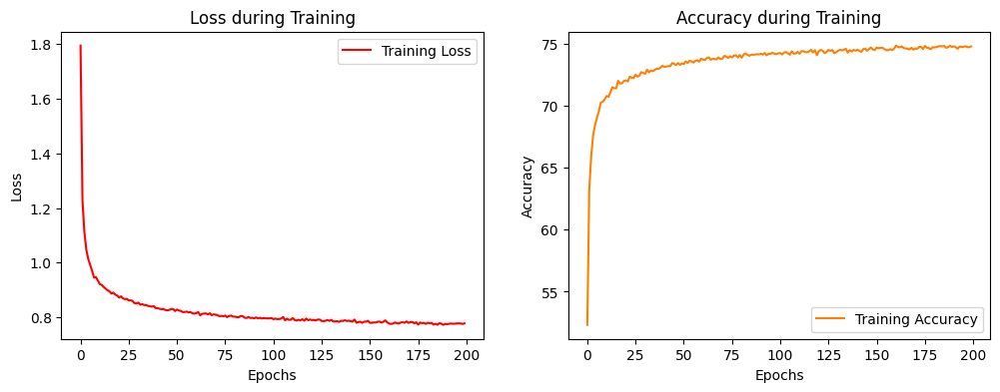

In [ ]:
train_loader = DataLoader(emnist_train, batch_size=16, shuffle=True, num_workers=2)
valid_loader = DataLoader(emnist_mini, batch_size=100, shuffle=True, num_workers=2)
lenet = LeNet().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(lenet.parameters(), lr=0.1)

train(lenet, train_loader, valid_loader, optimizer, criterion, 200)

#### Model performance

Accuracy on the training set: 82.97%.
Precision on the training set: 80.34%.
Recall on the training set: 82.97%.
F1 Score on the training set: 79.93%.
Accuracy on the test set: 82.10%.
Precision on the test set: 79.59%.
Recall on the test set: 82.10%.
F1 Score on the test set: 79.18%.


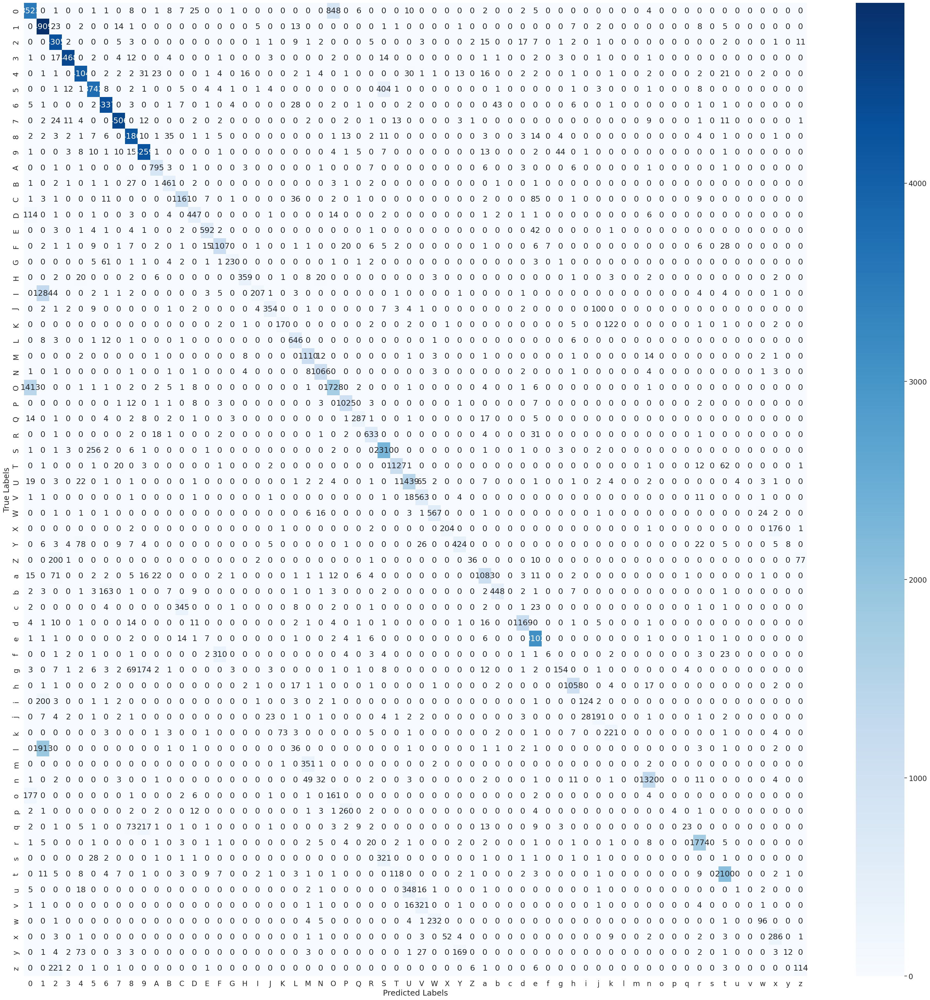

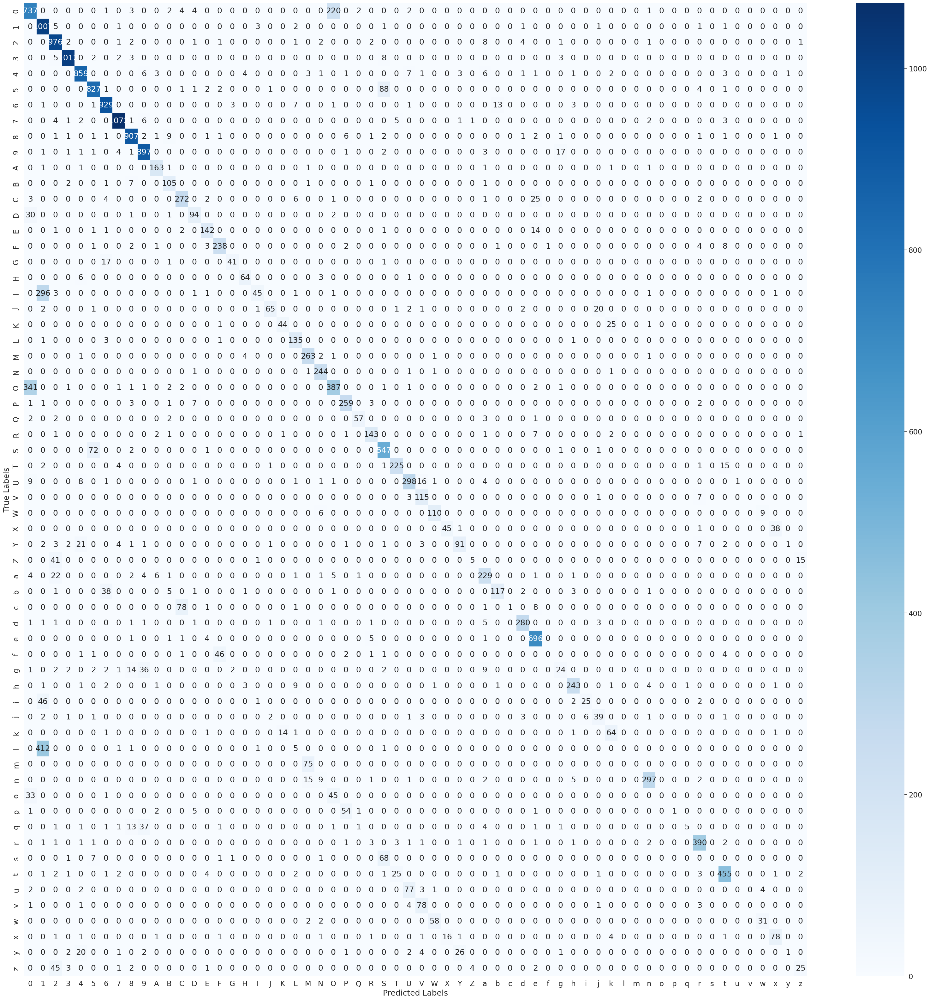

In [ ]:
train_loader = DataLoader(emnist_train, batch_size=100, shuffle=True, num_workers=2)
test_loader = DataLoader(emnist_test, batch_size=100, shuffle=True, num_workers=2)
acc_train, precision_train, recall_train, f1_train, cm_train = evaluate(lenet, train_loader)
acc_test, precision_test, recall_test, f1_test, cm_test = evaluate(lenet, test_loader)
print(f"Accuracy on the training set: {acc_train*100:.2f}%.")
print(f"Precision on the training set: {precision_train*100:.2f}%.")
print(f"Recall on the training set: {recall_train*100:.2f}%.")
print(f"F1 Score on the training set: {f1_train*100:.2f}%.")
print(f"Accuracy on the test set: {acc_test*100:.2f}%.")
print(f"Precision on the test set: {precision_test*100:.2f}%.")
print(f"Recall on the test set: {recall_test*100:.2f}%.")
print(f"F1 Score on the test set: {f1_test*100:.2f}%.")
confusion_matrix_viz(cm_train)
confusion_matrix_viz(cm_test)

#### Save the parameters

In [ ]:
torch.save(lenet.state_dict(), dir + "lenet.pth")

### AlexNet
Paper link: [ImageNet Classification with Deep Convolutional Neural Networks](https://dl.acm.org/doi/pdf/10.1145/3065386)

#### Definition

In [ ]:
# A variant of AlexNet
class AlexNet(nn.Module):
  def __init__(self, num_classes=62):
    super(AlexNet, self).__init__()
    self.features = nn.Sequential(
        nn.Conv2d(1, 16, kernel_size=3, padding=2),
        nn.ReLU(inplace=True),
        nn.MaxPool2d(kernel_size=3, stride=2),
        nn.Conv2d(16, 48, kernel_size=3, padding=2),
        nn.ReLU(inplace=True),
        nn.MaxPool2d(kernel_size=3, stride=2),
        nn.Conv2d(48, 96, kernel_size=3, padding=1),
        nn.ReLU(inplace=True),
        nn.Conv2d(96, 64, kernel_size=3, padding=1),
        nn.ReLU(inplace=True),
        nn.Conv2d(64, 64, kernel_size=3, padding=1),
        nn.ReLU(inplace=True),
        nn.MaxPool2d(kernel_size=3, stride=2),
    )
    self.avgpool = nn.AdaptiveAvgPool2d((3, 3))
    self.classifier = nn.Sequential(
        nn.Dropout(),
        nn.Linear(64 * 3 * 3, 1024),
        nn.BatchNorm1d(1024),
        nn.ReLU(inplace=True),
        nn.Dropout(),
        nn.Linear(1024, 1024),
        nn.BatchNorm1d(1024),
        nn.ReLU(inplace=True),
        nn.Linear(1024, num_classes),
    )
    self._initialize_weights()

  def forward(self, x):
    x = self.features(x)
    x = self.avgpool(x)
    x = torch.flatten(x, 1)
    x = self.classifier(x)
    return x

  def _initialize_weights(self):
    for m in self.modules():
      if isinstance(m, nn.Conv2d):
        init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None:
          init.constant_(m.bias, 0)
      elif isinstance(m, nn.BatchNorm2d):
        init.constant_(m.weight, 1)
        init.constant_(m.bias, 0)
      elif isinstance(m, nn.Linear):
        init.normal_(m.weight, 0, 0.01)
        init.constant_(m.bias, 0)

#### Model structure

In [ ]:
network_structure(AlexNet())

Model layers:
Layer 1 (Convolutional Layer 1): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
Layer 2 (Convolutional Layer 2): Conv2d(16, 48, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2))
Layer 3 (Convolutional Layer 3): Conv2d(48, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Layer 4 (Convolutional Layer 4): Conv2d(96, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Layer 5 (Convolutional Layer 5): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Layer 6 (Fully-connected Layer 1): Linear(in_features=576, out_features=1024, bias=True)
Layer 7 (Fully-connected Layer 2): Linear(in_features=1024, out_features=1024, bias=True)
Layer 8 (Fully-connected Layer 3): Linear(in_features=1024, out_features=62, bias=True)
Summary: There are 5 convoluitonal layers and 3 fully-connected layers.


#### Hyperparameter tuning

In [ ]:
print("Best parameters:")
random_search(AlexNet, param_grid)

Best parameters:


100%|██████████| 28/28 [24:00<00:00, 51.46s/it]


{'weight_decay': 0, 'momentum': 0.95, 'learning_rate': 0.001, 'batch_size': 16}

#### Model training

100%|██████████| 200/200 [2:00:44<00:00, 36.22s/it]



Training procedure running time: 2 hours, 0 minutes, and 44.81 seconds.


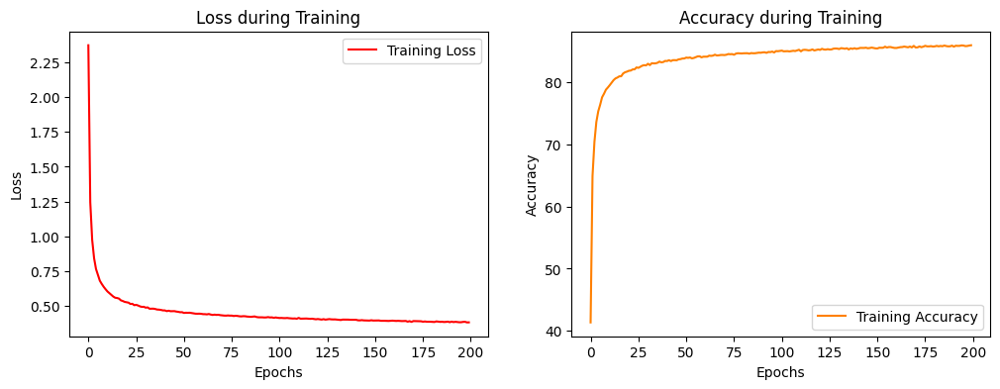

In [ ]:
train_loader = DataLoader(emnist_augment, batch_size=16, shuffle=True, num_workers=2)
valid_loader = DataLoader(emnist_mini, batch_size=100, shuffle=True, num_workers=2)
alexnet = AlexNet().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(alexnet.parameters(), lr=0.001, momentum=0.95)

train(alexnet, train_loader, valid_loader, optimizer, criterion, 200)

#### Model performance

Accuracy on the training set: 88.21%.
Precision on the training set: 88.29%.
Recall on the training set: 88.21%.
F1 Score on the training set: 86.83%.
Accuracy on the test set: 86.85%.
Precision on the test set: 85.66%.
Recall on the test set: 86.85%.
F1 Score on the test set: 85.46%.


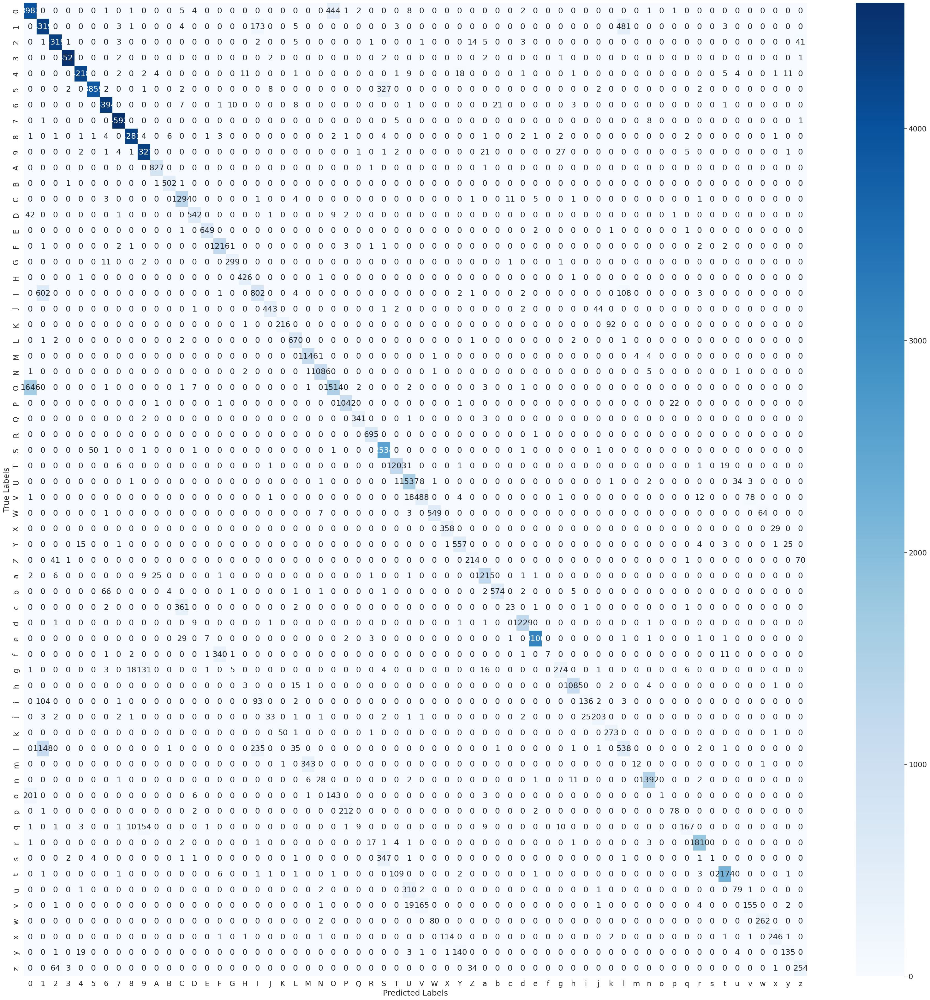

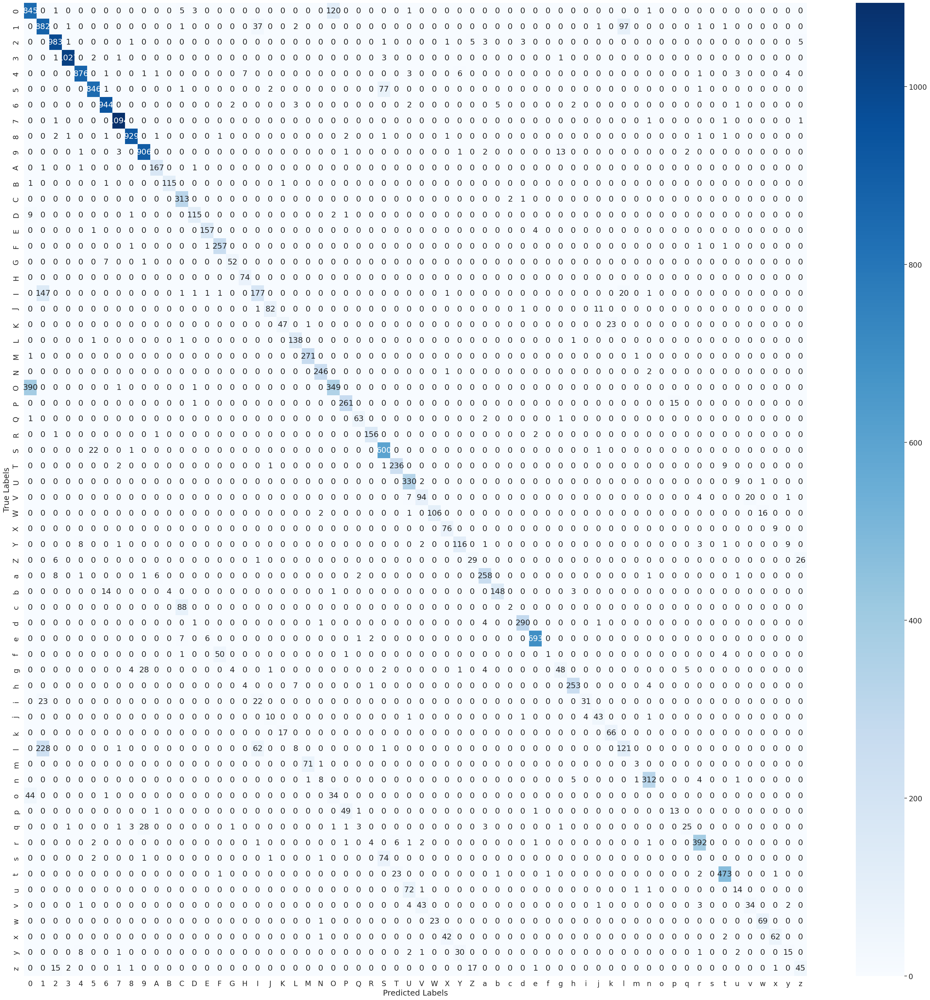

In [ ]:
train_loader = DataLoader(emnist_train, batch_size=100, shuffle=True, num_workers=2)
test_loader = DataLoader(emnist_test, batch_size=100, shuffle=True, num_workers=2)
acc_train, precision_train, recall_train, f1_train, cm_train = evaluate(alexnet, train_loader)
acc_test, precision_test, recall_test, f1_test, cm_test = evaluate(alexnet, test_loader)
print(f"Accuracy on the training set: {acc_train*100:.2f}%.")
print(f"Precision on the training set: {precision_train*100:.2f}%.")
print(f"Recall on the training set: {recall_train*100:.2f}%.")
print(f"F1 Score on the training set: {f1_train*100:.2f}%.")
print(f"Accuracy on the test set: {acc_test*100:.2f}%.")
print(f"Precision on the test set: {precision_test*100:.2f}%.")
print(f"Recall on the test set: {recall_test*100:.2f}%.")
print(f"F1 Score on the test set: {f1_test*100:.2f}%.")
confusion_matrix_viz(cm_train)
confusion_matrix_viz(cm_test)

#### Save the parameters

In [ ]:
torch.save(alexnet.state_dict(), dir + "alexnet.pth")

### VGGNet
Paper link: [Very Deep Convolutional Networks for Large-scale Image Recognition](https://arxiv.org/pdf/1409.1556.pdf%E3%80%82)

#### Definition

In [ ]:
# A variant of VGGNet
class VGGNet(nn.Module):
  def __init__(self, num_classes=62):
    super(VGGNet, self).__init__()
    self.features = nn.Sequential(
      # Block 1
      nn.Conv2d(1, 16, kernel_size=3, padding=1),
      nn.ReLU(inplace=True),

      # Block 2
      nn.Conv2d(16, 32, kernel_size=3, padding=1),
      nn.ReLU(inplace=True),
      nn.MaxPool2d(kernel_size=2, stride=2),

      # Block 3
      nn.Conv2d(32, 64, kernel_size=3, padding=1),
      nn.ReLU(inplace=True),
      nn.Conv2d(64, 64, kernel_size=3, padding=1),
      nn.ReLU(inplace=True),

      # Block 4
      nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
      nn.ReLU(inplace=True),
      nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
      nn.ReLU(inplace=True),
      nn.MaxPool2d(kernel_size=2, stride=2),

      # Block 5
      nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
      nn.ReLU(inplace=True),
      nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
      nn.ReLU(inplace=True),
    )
    self.avgpool = nn.AdaptiveAvgPool2d((3, 3))
    self.classifier = nn.Sequential(
      nn.Linear(128 * 3 * 3, 512),
      nn.BatchNorm1d(512),
      nn.ReLU(inplace=True),
      nn.Dropout(),
      nn.Linear(512, 512),
      nn.BatchNorm1d(512),
      nn.ReLU(inplace=True),
      nn.Dropout(),
      nn.Linear(512, num_classes),
    )
    self._initialize_weights()

  def forward(self, x):
    x = self.features(x)
    x = self.avgpool(x)
    x = torch.flatten(x, 1)
    x = self.classifier(x)
    return x

  def _initialize_weights(self):
    for m in self.modules():
      if isinstance(m, nn.Conv2d):
        init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None:
          init.constant_(m.bias, 0)
      elif isinstance(m, nn.BatchNorm2d):
        init.constant_(m.weight, 1)
        init.constant_(m.bias, 0)
      elif isinstance(m, nn.Linear):
        init.normal_(m.weight, 0, 0.01)
        init.constant_(m.bias, 0)


#### Model structure

In [ ]:
network_structure(VGGNet())

Model layers:
Layer 1 (Convolutional Layer 1): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Layer 2 (Convolutional Layer 2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Layer 3 (Convolutional Layer 3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Layer 4 (Convolutional Layer 4): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Layer 5 (Convolutional Layer 5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Layer 6 (Convolutional Layer 6): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Layer 7 (Convolutional Layer 7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Layer 8 (Convolutional Layer 8): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Layer 9 (Fully-connected Layer 1): Linear(in_features=1152, out_features=512, bias=True)
Layer 10 (Fully-connected Layer 2): Linear(in_features=512, out_features=512, bias=True)
Layer 11 (

#### Hyperparameter tuning

In [ ]:
print("Best parameters:")
random_search(VGGNet, param_grid)

Best parameters:


100%|██████████| 28/28 [1:47:20<00:00, 230.03s/it]


{'weight_decay': 0, 'momentum': 0, 'learning_rate': 0.1, 'batch_size': 32}

#### Model training

100%|██████████| 200/200 [2:40:32<00:00, 48.16s/it]



Training procedure running time: 2 hours, 40 minutes, and 32.90 seconds.


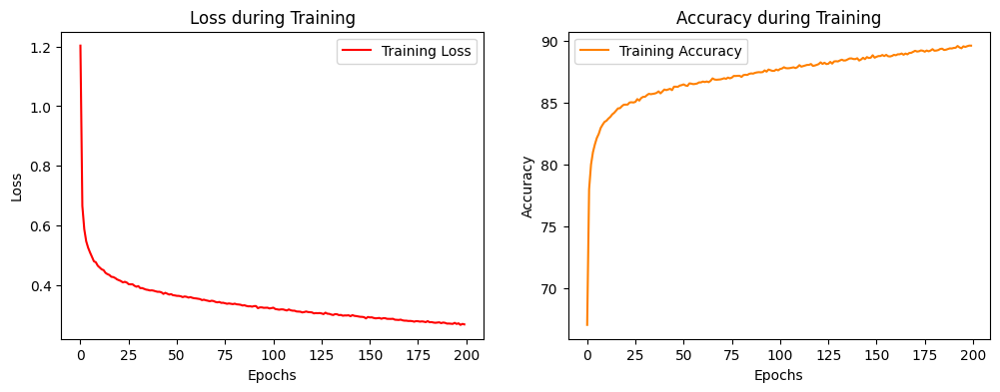

In [ ]:
train_loader = DataLoader(emnist_augment, batch_size=32, shuffle=True, num_workers=2)
valid_loader = DataLoader(emnist_mini, batch_size=100, shuffle=True, num_workers=2)
vggnet = VGGNet().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(vggnet.parameters(), lr=0.1)

train(vggnet, train_loader, valid_loader, optimizer, criterion, 200)

#### Model performance

Accuracy on the training set: 91.32%.
Precision on the training set: 92.04%.
Recall on the training set: 91.32%.
F1 Score on the training set: 90.39%.
Accuracy on the test set: 86.39%.
Precision on the test set: 86.16%.
Recall on the test set: 86.39%.
F1 Score on the test set: 85.22%.


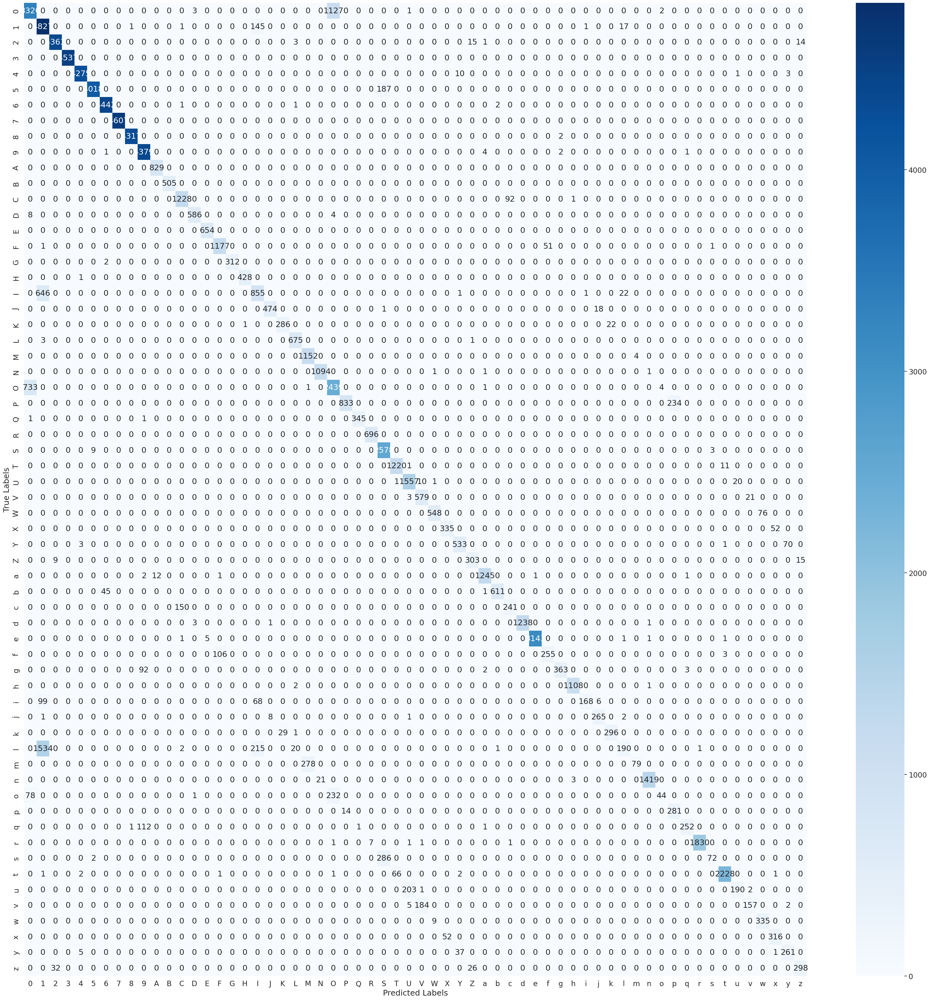

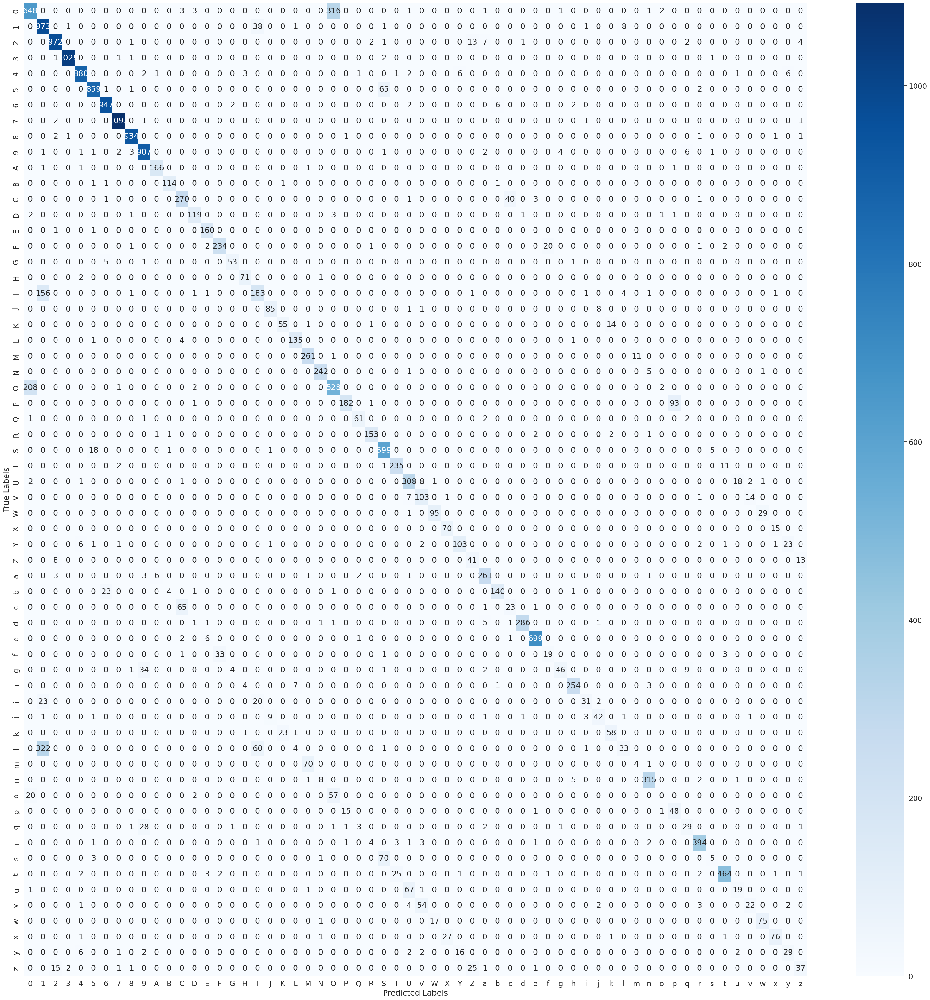

In [ ]:
train_loader = DataLoader(emnist_train, batch_size=100, shuffle=True, num_workers=2)
test_loader = DataLoader(emnist_test, batch_size=100, shuffle=True, num_workers=2)
acc_train, precision_train, recall_train, f1_train, cm_train = evaluate(vggnet, train_loader)
acc_test, precision_test, recall_test, f1_test, cm_test = evaluate(vggnet, test_loader)
print(f"Accuracy on the training set: {acc_train*100:.2f}%.")
print(f"Precision on the training set: {precision_train*100:.2f}%.")
print(f"Recall on the training set: {recall_train*100:.2f}%.")
print(f"F1 Score on the training set: {f1_train*100:.2f}%.")
print(f"Accuracy on the test set: {acc_test*100:.2f}%.")
print(f"Precision on the test set: {precision_test*100:.2f}%.")
print(f"Recall on the test set: {recall_test*100:.2f}%.")
print(f"F1 Score on the test set: {f1_test*100:.2f}%.")
confusion_matrix_viz(cm_train)
confusion_matrix_viz(cm_test)

#### Save the parameters

In [ ]:
torch.save(vggnet.state_dict(), dir + "vggnet.pth")

### SpinalNet
Paper link: [SpinalNet: Deep Neural Network with Gradual Input](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=9802918)

#### Definition

In [ ]:
# A variant of SpinalNet
class SpinalNet(nn.Module):
  def __init__(self, num_classes=62):
    super(SpinalNet, self).__init__()
    self.features = nn.Sequential(
        # Block 1
        nn.Conv2d(1, 32, kernel_size=5, stride=1, padding=2),
        nn.BatchNorm2d(32),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2),

        # Block 2
        nn.Conv2d(32, 64, kernel_size=5, stride=1, padding=2),
        nn.BatchNorm2d(64),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2)
    )

    self.spinal_layer1 = nn.Linear(7 * 7 * 64 // 2, 50)
    self.spinal_layer2 = nn.Linear(7 * 7 * 64 // 2 + 50, 50)
    self.spinal_layer3 = nn.Linear(7 * 7 * 64 // 2 + 50, 50)
    self.spinal_layer4 = nn.Linear(7 * 7 * 64 // 2 + 50, 50)

    self.classifier = nn.Linear(50 * 4, num_classes)

    self._initialize_weights()

  def _initialize_weights(self):
    for m in self.modules():
      if isinstance(m, nn.Conv2d):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None:
          nn.init.constant_(m.bias, 0)
      elif isinstance(m, nn.BatchNorm2d):
        nn.init.constant_(m.weight, 1)
        nn.init.constant_(m.bias, 0)
      elif isinstance(m, nn.Linear):
        nn.init.normal_(m.weight, 0, 0.01)
        nn.init.constant_(m.bias, 0)

  def forward(self, x):
    x = self.features(x)
    x = x.reshape(x.size(0), -1)

    x1 = F.dropout(F.relu(self.spinal_layer1(x[:, :7 * 7 * 64 // 2])), training=self.training)
    x2 = F.dropout(F.relu(self.spinal_layer2(torch.cat([x[:, 7 * 7 * 64 // 2:], x1], dim=1))), training=self.training)
    x3 = F.dropout(F.relu(self.spinal_layer3(torch.cat([x[:, :7 * 7 * 64 // 2], x2], dim=1))), training=self.training)
    x4 = F.dropout(F.relu(self.spinal_layer4(torch.cat([x[:, 7 * 7 * 64 // 2:], x3], dim=1))), training=self.training)

    x = torch.cat([x1, x2, x3, x4], dim=1)
    x = self.classifier(x)
    return x

#### Model structure

In [ ]:
network_structure(SpinalNet())

Model layers:
Layer 1 (Convolutional Layer 1): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
Layer 2 (Convolutional Layer 2): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
Layer 3 (Fully-connected Layer 1): Linear(in_features=1568, out_features=50, bias=True)
Layer 4 (Fully-connected Layer 2): Linear(in_features=1618, out_features=50, bias=True)
Layer 5 (Fully-connected Layer 3): Linear(in_features=1618, out_features=50, bias=True)
Layer 6 (Fully-connected Layer 4): Linear(in_features=1618, out_features=50, bias=True)
Layer 7 (Fully-connected Layer 5): Linear(in_features=200, out_features=62, bias=True)
Summary: There are 2 convoluitonal layers and 5 fully-connected layers.


#### Hyperparameter tuning

In [ ]:
print("Best parameters:")
random_search(SpinalNet, param_grid)

Best parameters:


100%|██████████| 28/28 [22:06<00:00, 47.37s/it]


{'weight_decay': 0.0001,
 'momentum': 0.85,
 'learning_rate': 0.01,
 'batch_size': 32}

#### Model training

100%|██████████| 200/200 [1:22:39<00:00, 24.80s/it]



Training procedure running time: 1 hours, 22 minutes, and 39.35 seconds.


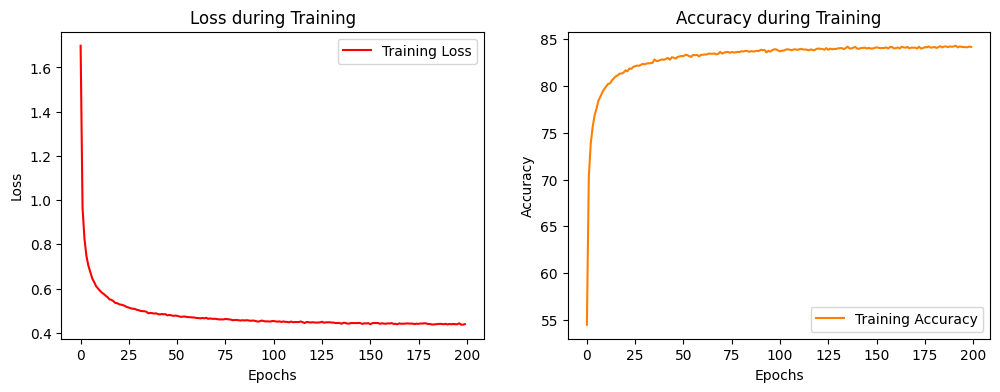

In [ ]:
train_loader = DataLoader(emnist_augment, batch_size=32, shuffle=True, num_workers=2)
valid_loader = DataLoader(emnist_mini, batch_size=100, shuffle=True, num_workers=2)
spinalnet = SpinalNet().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(spinalnet.parameters(), lr=0.01, weight_decay=0.0001, momentum=0.85)

train(spinalnet, train_loader, valid_loader, optimizer, criterion, 200)

#### Model performance

Accuracy on the training set: 87.21%.
Precision on the training set: 87.33%.
Recall on the training set: 87.21%.
F1 Score on the training set: 85.99%.
Accuracy on the test set: 86.18%.
Precision on the test set: 84.91%.
Recall on the test set: 86.18%.
F1 Score on the test set: 84.91%.


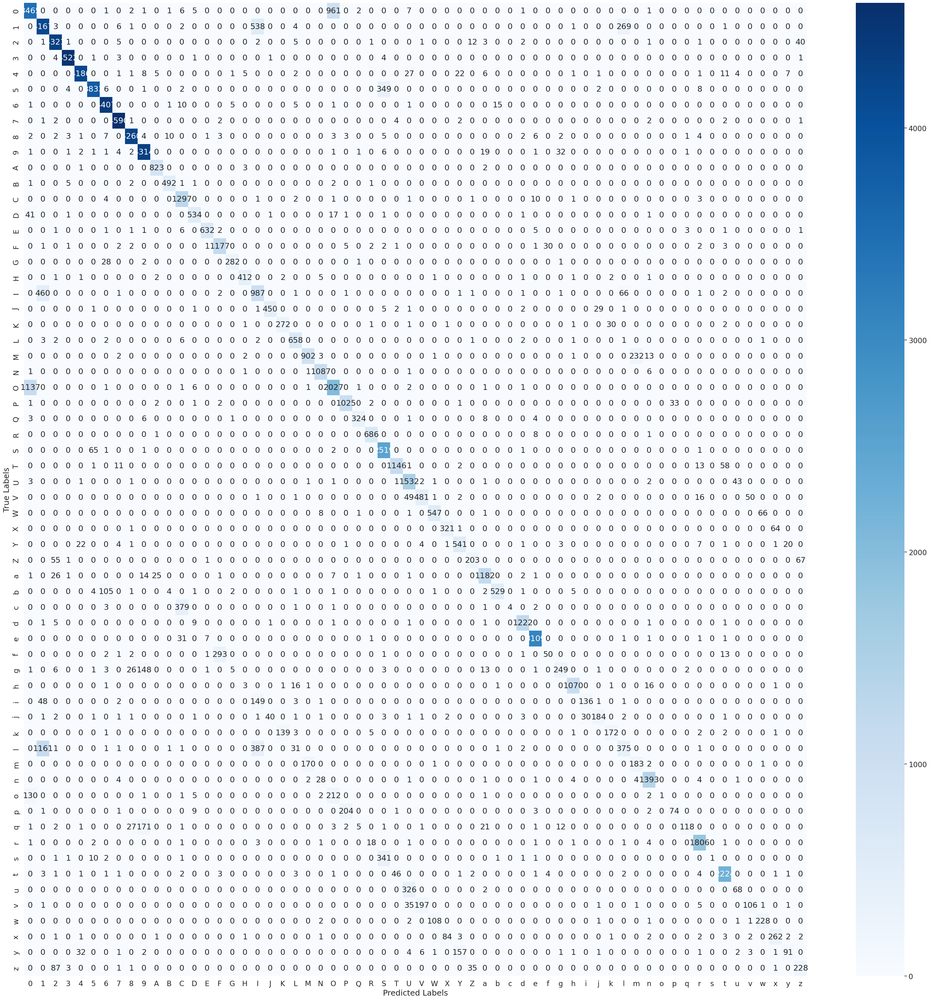

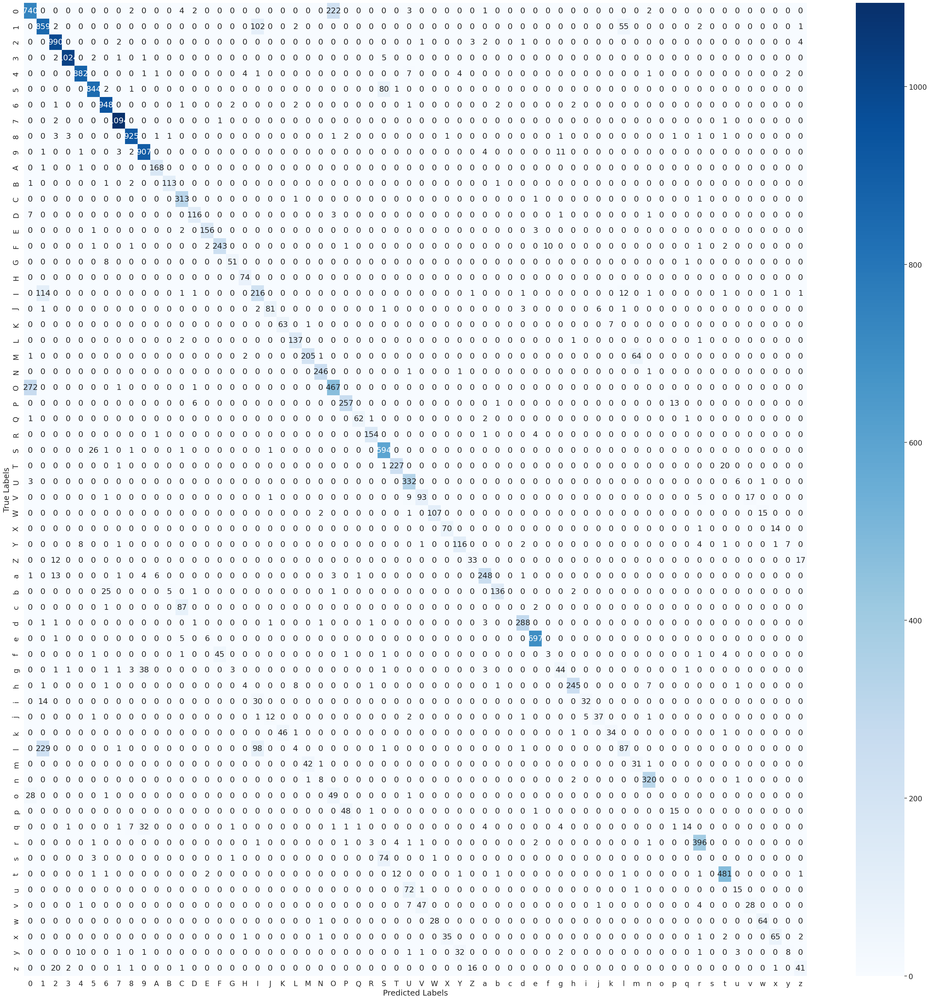

In [ ]:
train_loader = DataLoader(emnist_train, batch_size=100, shuffle=True, num_workers=2)
test_loader = DataLoader(emnist_test, batch_size=100, shuffle=True, num_workers=2)
acc_train, precision_train, recall_train, f1_train, cm_train = evaluate(spinalnet, train_loader)
acc_test, precision_test, recall_test, f1_test, cm_test = evaluate(spinalnet, test_loader)
print(f"Accuracy on the training set: {acc_train*100:.2f}%.")
print(f"Precision on the training set: {precision_train*100:.2f}%.")
print(f"Recall on the training set: {recall_train*100:.2f}%.")
print(f"F1 Score on the training set: {f1_train*100:.2f}%.")
print(f"Accuracy on the test set: {acc_test*100:.2f}%.")
print(f"Precision on the test set: {precision_test*100:.2f}%.")
print(f"Recall on the test set: {recall_test*100:.2f}%.")
print(f"F1 Score on the test set: {f1_test*100:.2f}%.")
confusion_matrix_viz(cm_train)
confusion_matrix_viz(cm_test)

#### Save the parameters

In [ ]:
torch.save(spinalnet.state_dict(), dir + "spinalnet.pth")

### ResNet
Paper link: [Deep Residual Learning for Image Recognition](https://openaccess.thecvf.com/content_cvpr_2016/papers/He_Deep_Residual_Learning_CVPR_2016_paper.pdf)

#### Definition

In [ ]:
# A variant of ResNet
class BasicBlock(nn.Module):
  def __init__(self, in_channels, out_channels, stride=1):
    super(BasicBlock, self).__init__()
    self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
    self.bn1 = nn.BatchNorm2d(out_channels)
    self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)
    self.bn2 = nn.BatchNorm2d(out_channels)

    self.shortcut = nn.Sequential()
    if stride != 1 or in_channels != out_channels:
      self.shortcut = nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False),
        nn.BatchNorm2d(out_channels)
      )
  def forward(self, x):
    out = nn.ReLU(inplace=True)(self.bn1(self.conv1(x)))
    out = self.bn2(self.conv2(out))
    out += self.shortcut(x)
    out = nn.ReLU(inplace=True)(out)
    return out

class ResNet(nn.Module):
  def __init__(self, num_classes=62):
    super(ResNet, self).__init__()
    self.in_channels = 16

    self.model = nn.Sequential(
      nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1, bias=False),
      nn.BatchNorm2d(16),
      nn.ReLU(inplace=True),
      nn.MaxPool2d(kernel_size=3, stride=2, padding=1),
      self._make_layer(16, 2, stride=1),
      self._make_layer(32, 2, stride=2),
      self._make_layer(64, 2, stride=2),
      self._make_layer(128, 2, stride=2),
      nn.AdaptiveAvgPool2d((1, 1)),
      nn.Flatten(start_dim=1),
      nn.Linear(128, num_classes)
  )
    self._initialize_weights()

  def _make_layer(self, out_channels, num_blocks, stride):
    strides = [stride] + [1] * (num_blocks - 1)
    layers = []
    for stride in strides:
      layers.append(BasicBlock(self.in_channels, out_channels, stride))
      self.in_channels = out_channels
    return nn.Sequential(*layers)

  def forward(self, x):
    return self.model(x)

  def _initialize_weights(self):
    for m in self.modules():
      if isinstance(m, nn.Conv2d):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None:
          nn.init.constant_(m.bias, 0)
      elif isinstance(m, nn.BatchNorm2d):
        nn.init.constant_(m.weight, 1)
        nn.init.constant_(m.bias, 0)
      elif isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        nn.init.constant_(m.bias, 0)

#### Model structure

In [ ]:
network_structure(ResNet())

Model layers:
Layer 1 (Convolutional Layer 1): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
Layer 2 (Convolutional Layer 2): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
Layer 3 (Convolutional Layer 3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
Layer 4 (Convolutional Layer 4): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
Layer 5 (Convolutional Layer 5): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
Layer 6 (Convolutional Layer 6): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
Layer 7 (Convolutional Layer 7): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
Layer 8 (Convolutional Layer 8): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
Layer 9 (Convolutional Layer 9): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), 

#### Hyperparamter tuning

In [ ]:
param_grid = param_grid = {
    'learning_rate': [1e-3, 1e-2, 1e-1],
    'batch_size': [64],
    'momentum': [0, 0.85, 0.9, 0.95],
    'weight_decay': [0, 1e-2, 1e-3, 1e-4]
}
print("Best parameters:")
random_search(ResNet, param_grid, 10)

Best parameters:


100%|██████████| 10/10 [08:57<00:00, 53.75s/it]


{'weight_decay': 0.001,
 'momentum': 0.85,
 'learning_rate': 0.1,
 'batch_size': 64}

#### Model training

100%|██████████| 200/200 [1:35:09<00:00, 28.55s/it]



Training procedure running time: 1 hours, 35 minutes, and 9.61 seconds.


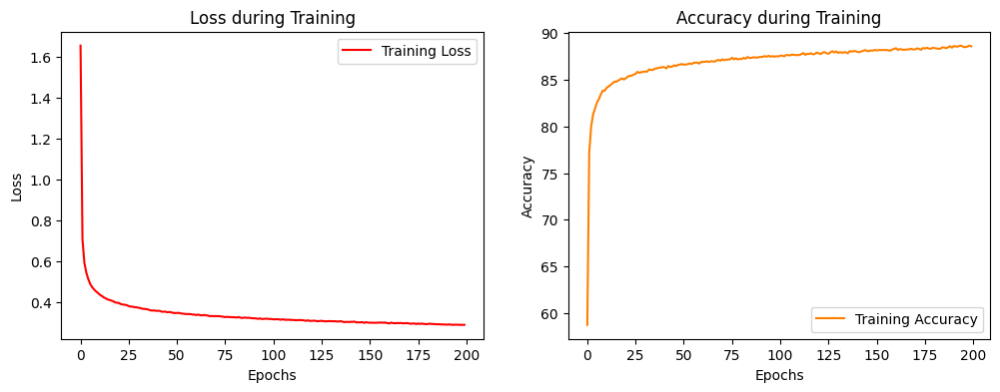

In [ ]:
train_loader = DataLoader(emnist_augment, batch_size=64, shuffle=True, num_workers=2)
valid_loader = DataLoader(emnist_mini, batch_size=100, shuffle=True, num_workers=2)
resnet = ResNet().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(resnet.parameters(), lr=1e-2, weight_decay=1e-4, momentum=0.85)

train(resnet, train_loader, valid_loader, optimizer, criterion, 200)

#### Model performance

Accuracy on the training set: 90.36%.
Precision on the training set: 90.80%.
Recall on the training set: 90.36%.
F1 Score on the training set: 89.24%.
Accuracy on the test set: 86.53%.
Precision on the test set: 85.96%.
Recall on the test set: 86.53%.
F1 Score on the test set: 85.15%.


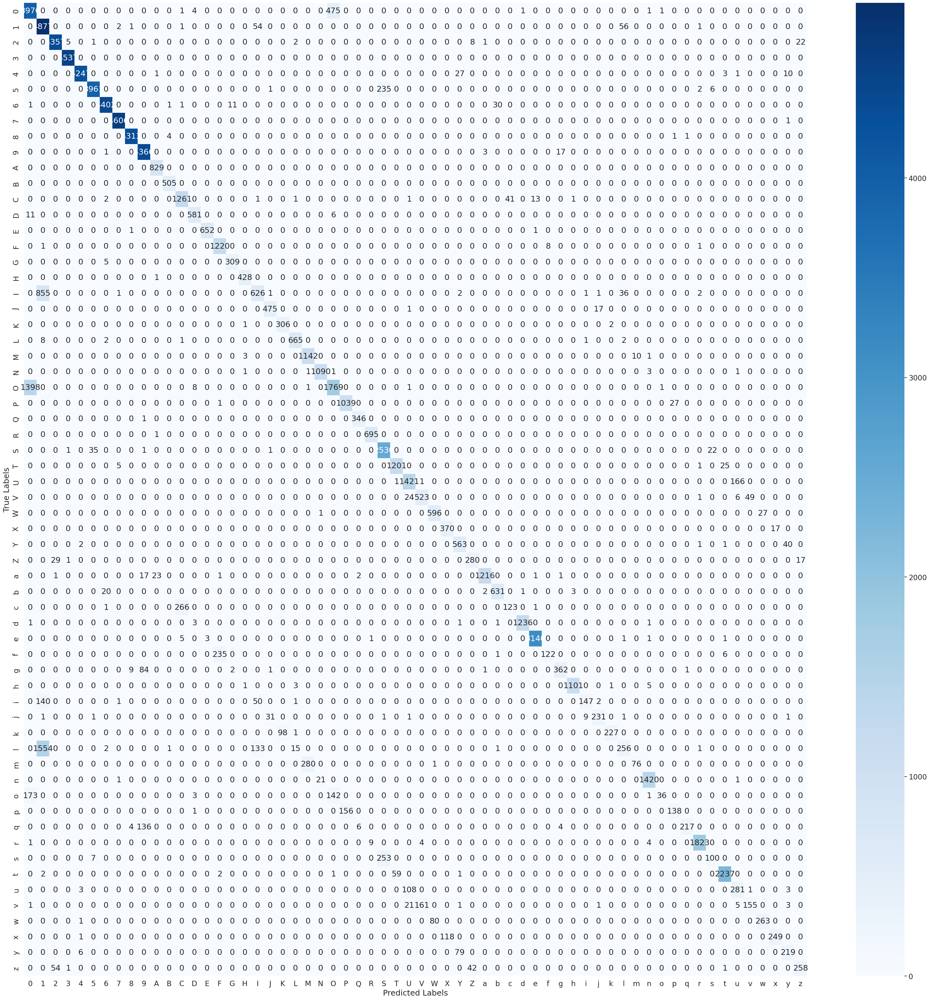

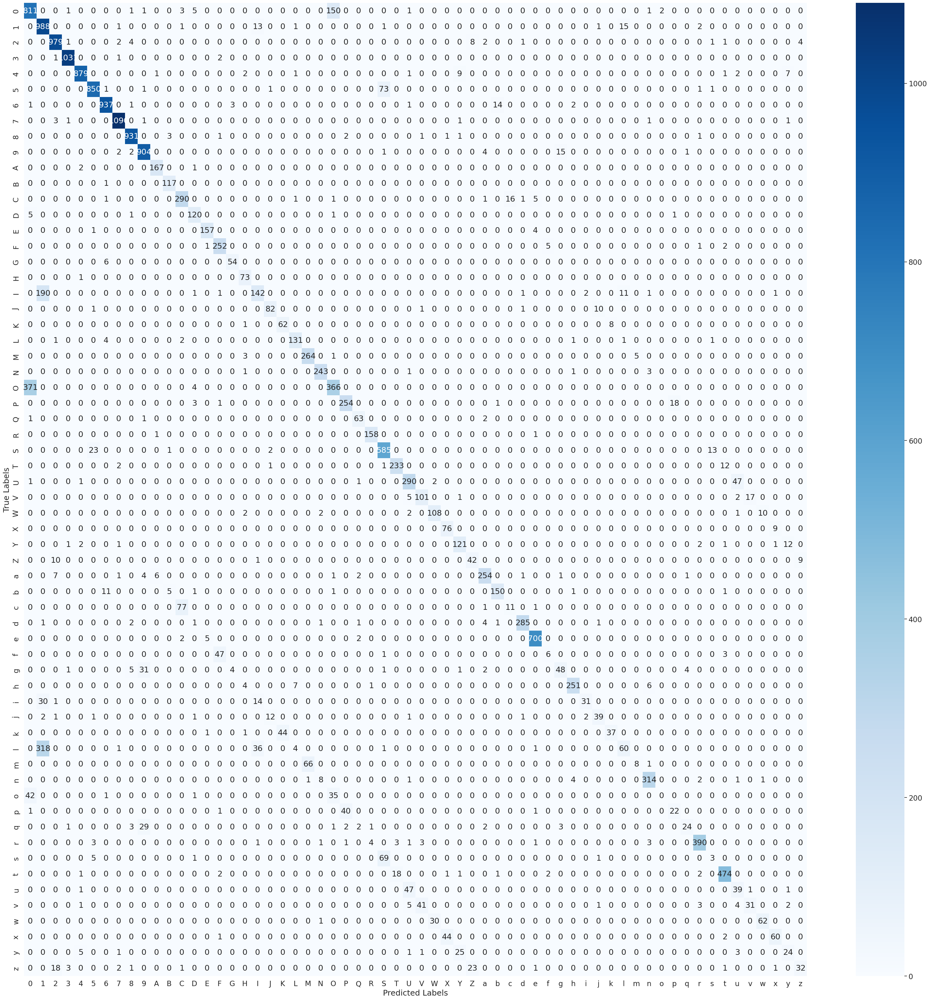

In [ ]:
train_loader = DataLoader(emnist_train, batch_size=100, shuffle=True, num_workers=2)
test_loader = DataLoader(emnist_test, batch_size=100, shuffle=True, num_workers=2)
acc_train, precision_train, recall_train, f1_train, cm_train = evaluate(resnet, train_loader)
acc_test, precision_test, recall_test, f1_test, cm_test = evaluate(resnet, test_loader)
print(f"Accuracy on the training set: {acc_train*100:.2f}%.")
print(f"Precision on the training set: {precision_train*100:.2f}%.")
print(f"Recall on the training set: {recall_train*100:.2f}%.")
print(f"F1 Score on the training set: {f1_train*100:.2f}%.")
print(f"Accuracy on the test set: {acc_test*100:.2f}%.")
print(f"Precision on the test set: {precision_test*100:.2f}%.")
print(f"Recall on the test set: {recall_test*100:.2f}%.")
print(f"F1 Score on the test set: {f1_test*100:.2f}%.")
confusion_matrix_viz(cm_train)
confusion_matrix_viz(cm_test)

#### Save the parameters

In [ ]:
torch.save(resnet.state_dict(), dir + "resnet.pth")

### ResNet-50(Extended)

#### Definition

In [ ]:
class BasicBlock(nn.Module):
  expansion = 1

  def __init__(self, in_channels, out_channels, stride=1):
    super(BasicBlock, self).__init__()
    self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
    self.bn1 = nn.BatchNorm2d(out_channels)
    self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)
    self.bn2 = nn.BatchNorm2d(out_channels)

    self.shortcut = nn.Sequential()
    if stride != 1 or in_channels != out_channels:
      self.shortcut = nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False),
        nn.BatchNorm2d(out_channels)
      )

  def forward(self, x):
    out = F.relu(self.bn1(self.conv1(x)))
    out = self.bn2(self.conv2(out))
    out += self.shortcut(x)
    out = F.relu(out)
    return out

class Bottleneck(nn.Module):
  expansion = 4

  def __init__(self, in_channels, out_channels, stride=1):
    super(Bottleneck, self).__init__()
    self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False)
    self.bn1 = nn.BatchNorm2d(out_channels)
    self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
    self.bn2 = nn.BatchNorm2d(out_channels)
    self.conv3 = nn.Conv2d(out_channels, out_channels*self.expansion, kernel_size=1, bias=False)
    self.bn3 = nn.BatchNorm2d(out_channels*self.expansion)

    self.shortcut = nn.Sequential()
    if stride != 1 or in_channels != out_channels*self.expansion:
      self.shortcut = nn.Sequential(
        nn.Conv2d(in_channels, out_channels*self.expansion, kernel_size=1, stride=stride, bias=False),
        nn.BatchNorm2d(out_channels*self.expansion)
      )

  def forward(self, x):
    out = F.relu(self.bn1(self.conv1(x)))
    out = F.relu(self.bn2(self.conv2(out)))
    out = self.bn3(self.conv3(out))
    out += self.shortcut(x)
    out = F.relu(out)
    return out

class ResNet(nn.Module):
  def __init__(self, block, num_blocks, num_classes=62):
    super(ResNet, self).__init__()
    self.in_channels = 64

    self.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
    self.bn1 = nn.BatchNorm2d(64)
    self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
    self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
    self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
    self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
    self.linear = nn.Linear(512*block.expansion, num_classes)

  def _make_layer(self, block, out_channels, num_blocks, stride):
    strides = [stride] + [1]*(num_blocks-1)
    layers = []
    for stride in strides:
      layers.append(block(self.in_channels, out_channels, stride))
      self.in_channels = out_channels * block.expansion
    return nn.Sequential(*layers)

  def forward(self, x):
    out = F.relu(self.bn1(self.conv1(x)))
    out = F.max_pool2d(out, kernel_size=3, stride=2, padding=1)
    out = self.layer1(out)
    out = self.layer2(out)
    out = self.layer3(out)
    out = self.layer4(out)
    out = F.avg_pool2d(out, out.size()[2:])
    out = out.view(out.size(0), -1)
    out = self.linear(out)
    return out

def ResNet50(num_classes=62):
  return ResNet(Bottleneck, [3, 4, 6, 3], num_classes)

#### Model training

100%|██████████| 200/200 [3:08:41<00:00, 56.61s/it]



Training procedure running time: 3 hour(s), 8 minute(s), and 41.91 second(s).


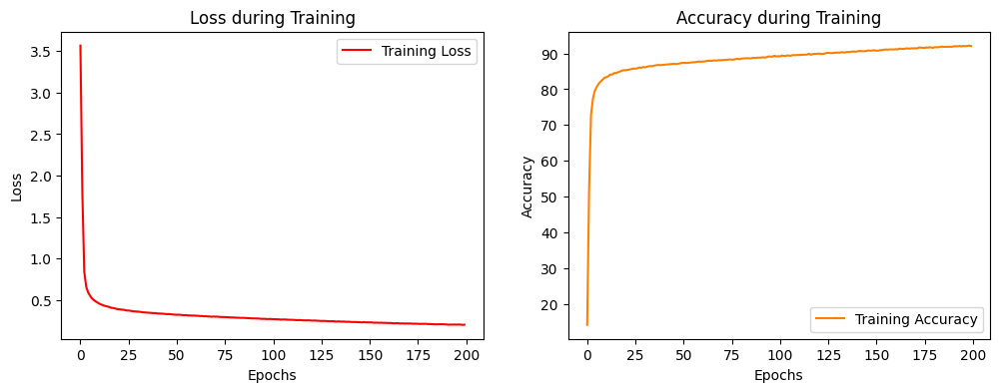

In [ ]:
train_loader = DataLoader(emnist_augment, batch_size=64, shuffle=True, num_workers=2)
valid_loader = DataLoader(emnist_mini, batch_size=100, shuffle=True, num_workers=2)
resnet50 = ResNet50().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(resnet50.parameters(), lr=1e-2, weight_decay=1e-4, momentum=0.85)

train(resnet50, train_loader, valid_loader, optimizer, criterion, 200)

#### Model performance

Accuracy on the training set: 95.13%.
Precision on the training set: 95.17%.
Recall on the training set: 95.13%.
F1 Score on the training set: 94.83%.
Accuracy on the test set: 85.18%.
Precision on the test set: 84.60%.
Recall on the test set: 85.18%.
F1 Score on the test set: 84.53%.


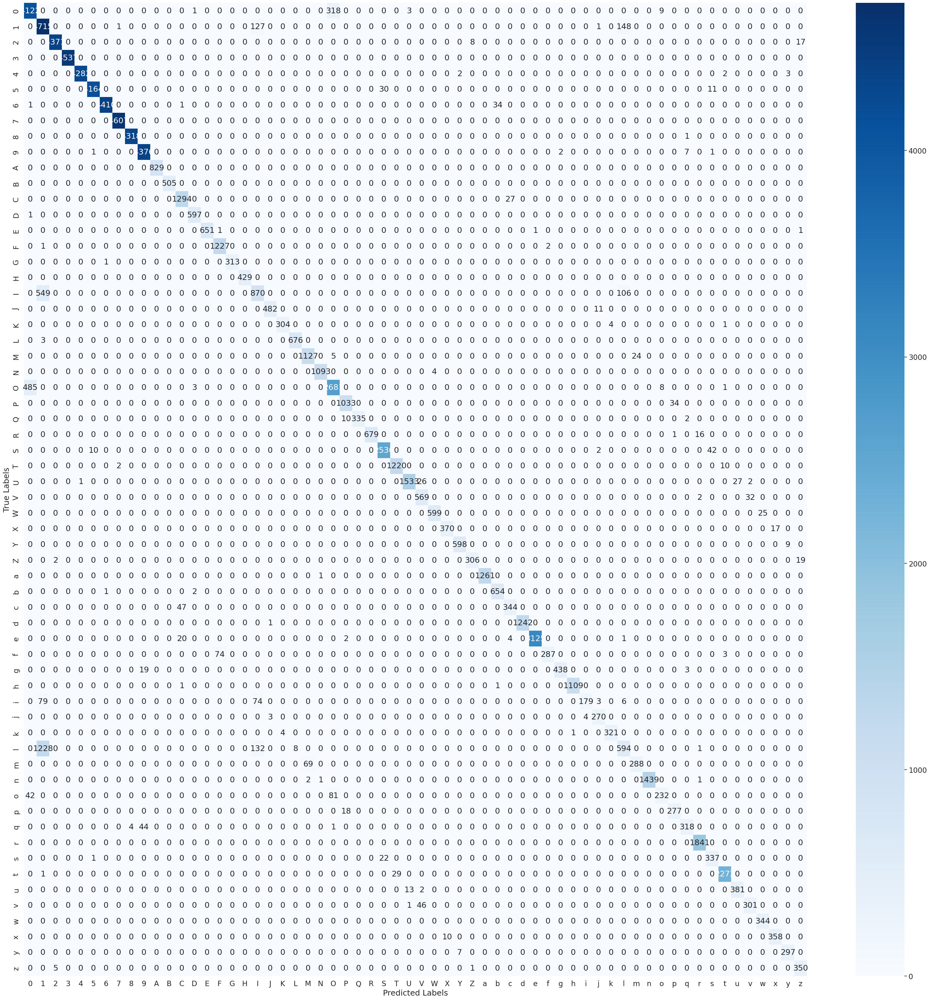

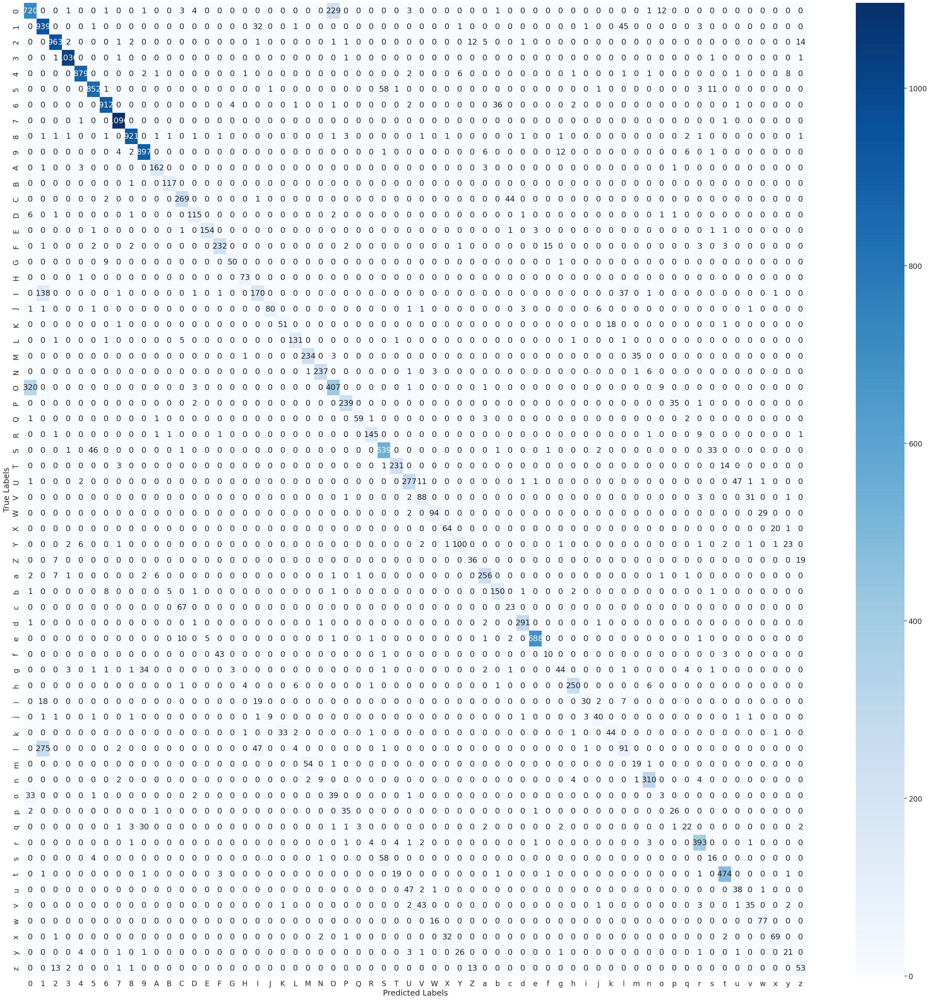

In [ ]:
train_loader = DataLoader(emnist_train, batch_size=100, shuffle=True, num_workers=2)
test_loader = DataLoader(emnist_test, batch_size=100, shuffle=True, num_workers=2)
acc_train, precision_train, recall_train, f1_train, cm_train = evaluate(resnet50, train_loader)
acc_test, precision_test, recall_test, f1_test, cm_test = evaluate(resnet50, test_loader)
print(f"Accuracy on the training set: {acc_train*100:.2f}%.")
print(f"Precision on the training set: {precision_train*100:.2f}%.")
print(f"Recall on the training set: {recall_train*100:.2f}%.")
print(f"F1 Score on the training set: {f1_train*100:.2f}%.")
print(f"Accuracy on the test set: {acc_test*100:.2f}%.")
print(f"Precision on the test set: {precision_test*100:.2f}%.")
print(f"Recall on the test set: {recall_test*100:.2f}%.")
print(f"F1 Score on the test set: {f1_test*100:.2f}%.")
confusion_matrix_viz(cm_train)
confusion_matrix_viz(cm_test)

#### Save the parameters

In [ ]:
torch.save(resnet50.state_dict(), dir + "resnet50.pth")

### EnsNet
Paper link: [Ensemble Learning in CNN Augmented with Fully Connected Subnetworks](https://arxiv.org/pdf/2003.08562.pdf)

#### Definition

In [ ]:
# A variant of EnsNet
class EnsNet(nn.Module):
  def __init__(self, num_classes=62):
      super(EnsNet, self).__init__()
      self.features = nn.Sequential(
        nn.Conv2d(1, 64, kernel_size=3, padding=1),
        nn.BatchNorm2d(64),
        nn.ReLU(inplace=True),
        nn.Dropout(0.35),
        nn.Conv2d(64, 128, kernel_size=3),
        nn.BatchNorm2d(128),
        nn.ReLU(inplace=True),
        nn.Dropout(0.35),
        nn.Conv2d(128, 256, 3, padding=1),
        nn.BatchNorm2d(256),
        nn.ReLU(inplace=True),

        nn.MaxPool2d(kernel_size=2, stride=2),

        nn.Dropout(0.35),
        nn.Conv2d(256, 512, kernel_size=3, padding=1),
        nn.BatchNorm2d(512),
        nn.ReLU(inplace=True),
        nn.Dropout(0.35),
        nn.Conv2d(512, 1024, kernel_size=3),
        nn.BatchNorm2d(1024),
        nn.ReLU(inplace=True),
        nn.Dropout(0.35),
        nn.Conv2d(1024, 2000, 3, padding=1),
        nn.BatchNorm2d(2000),
        nn.ReLU(inplace=True),

        nn.MaxPool2d(2, 2),

        nn.Dropout(0.35),
    )
      self.avgpool = nn.AdaptiveAvgPool2d((3, 3))
      self.classifier_major = nn.Linear(200 * 3 * 3, num_classes)
      self.classifiers = nn.ModuleList([
          nn.Linear(200 * 3 * 3, num_classes)
          for _ in range(10)
      ])
      self.weights = nn.Parameter(torch.ones(11) / 11, requires_grad=True)

  def forward(self, x):
    x = self.features(x)
    x = self.avgpool(x)
    x = torch.flatten(x, 1)
    x_major = self.classifier_major(x[:, :200 * 3 * 3])
    x_rest = [classifier(x[:, 200 * i * 3 * 3:200 * (i + 1) * 3 * 3]) for i, classifier in enumerate(self.classifiers)]
    all_x = torch.stack([x_major] + x_rest, dim=1)
    weighted_x = torch.sum(all_x * self.weights.view(1, -1, 1), dim=1)
    return weighted_x

#### Model structure

In [ ]:
network_structure(EnsNet())

Model layers:
Layer 1 (Convolutional Layer 1): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Layer 2 (Convolutional Layer 2): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1))
Layer 3 (Convolutional Layer 3): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Layer 4 (Convolutional Layer 4): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Layer 5 (Convolutional Layer 5): Conv2d(512, 1024, kernel_size=(3, 3), stride=(1, 1))
Layer 6 (Convolutional Layer 6): Conv2d(1024, 2000, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
Layer 7 (Fully-connected Layer 1): Linear(in_features=1800, out_features=62, bias=True)
Summary: There are 6 convoluitonal layers and 1 fully-connected layers.


#### Model training

100%|██████████| 20/20 [1:12:14<00:00, 216.74s/it]



Training procedure running time: 1 hours, 12 minutes, and 14.71 seconds.


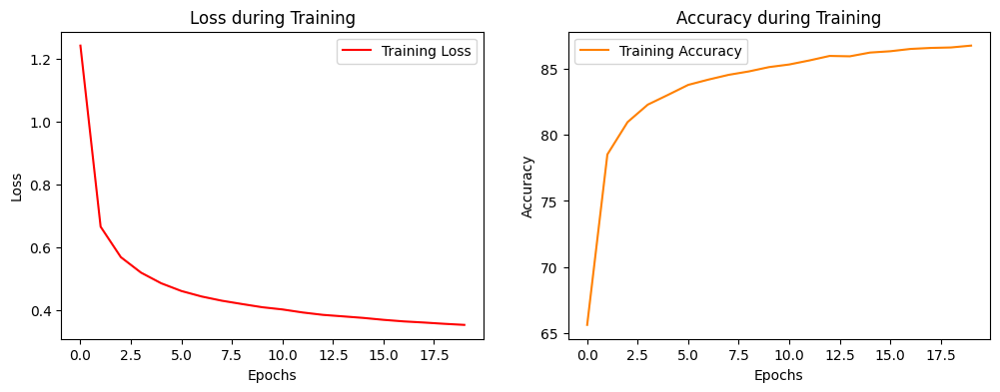

In [ ]:
train_loader = DataLoader(emnist_train, batch_size=100, shuffle=True, num_workers=2)
valid_loader = DataLoader(emnist_mini, batch_size=100, shuffle=True, num_workers=2)
ensnet = EnsNet().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(ensnet.parameters(), lr=0.1)

train(ensnet, train_loader, valid_loader, optimizer, criterion, 20)

#### Model performance

Accuracy on the training set: 86.32%.
Precision on the training set: 87.07%.
Recall on the training set: 86.32%.
F1 Score on the training set: 85.24%.
Accuracy on the test set: 84.61%.
Precision on the test set: 84.32%.
Recall on the test set: 84.61%.
F1 Score on the test set: 83.37%.


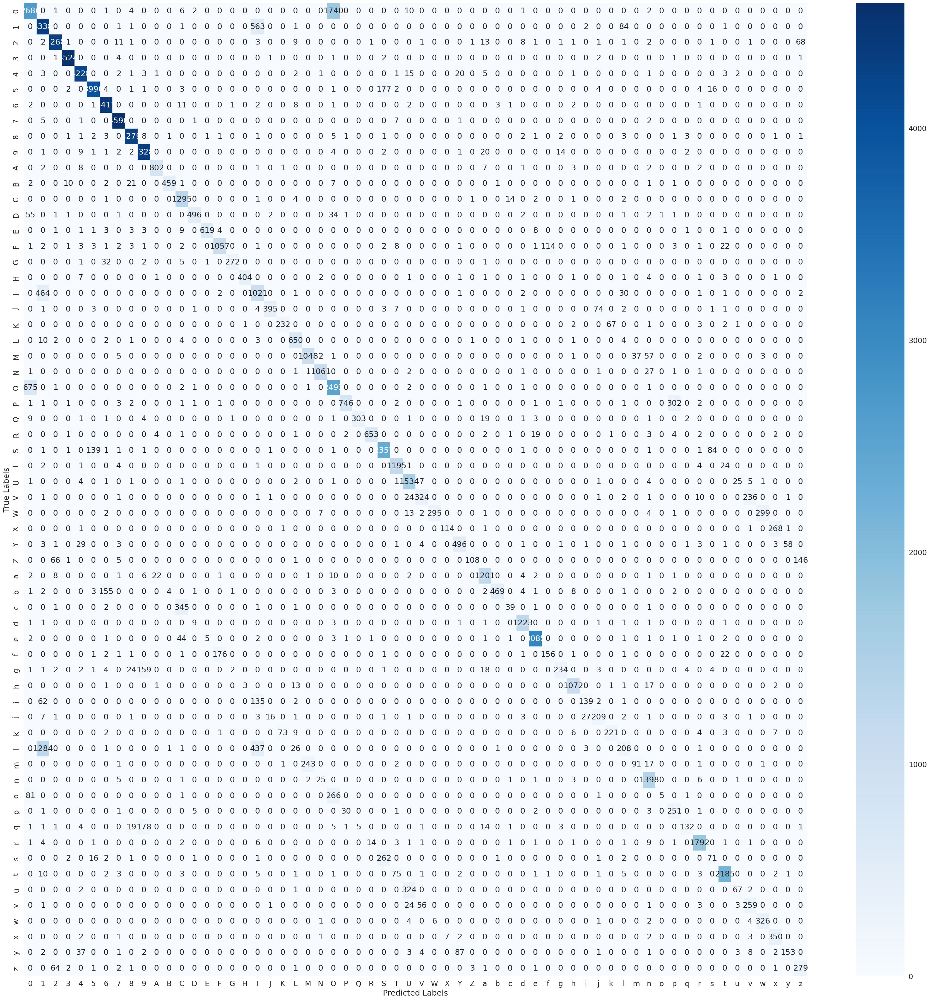

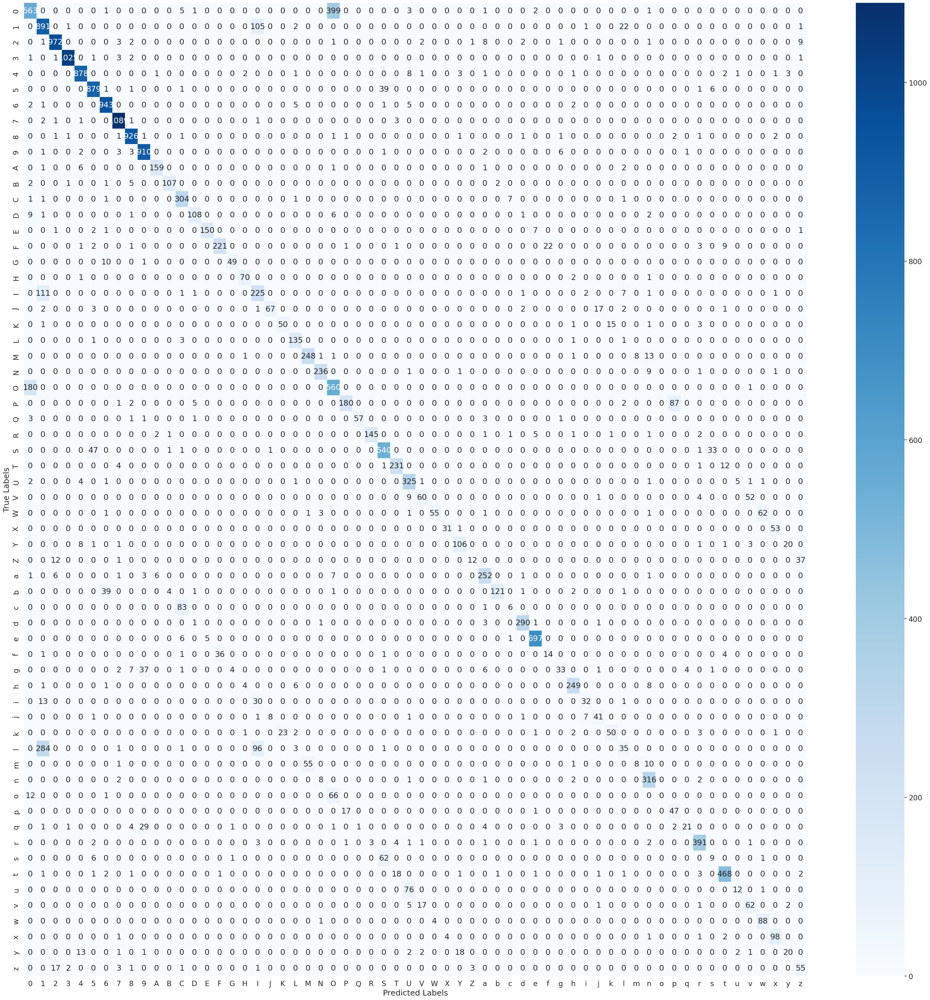

In [ ]:
train_loader = DataLoader(emnist_train, batch_size=100, shuffle=True, num_workers=2)
test_loader = DataLoader(emnist_test, batch_size=100, shuffle=True, num_workers=2)
acc_train, precision_train, recall_train, f1_train, cm_train = evaluate(ensnet, train_loader)
acc_test, precision_test, recall_test, f1_test, cm_test = evaluate(ensnet, test_loader)
print(f"Accuracy on the training set: {acc_train*100:.2f}%.")
print(f"Precision on the training set: {precision_train*100:.2f}%.")
print(f"Recall on the training set: {recall_train*100:.2f}%.")
print(f"F1 Score on the training set: {f1_train*100:.2f}%.")
print(f"Accuracy on the test set: {acc_test*100:.2f}%.")
print(f"Precision on the test set: {precision_test*100:.2f}%.")
print(f"Recall on the test set: {recall_test*100:.2f}%.")
print(f"F1 Score on the test set: {f1_test*100:.2f}%.")
confusion_matrix_viz(cm_train)
confusion_matrix_viz(cm_test)

#### Save the parameters

In [ ]:
torch.save(ensnet.state_dict(), dir + "ensnet.pth")

## Fine tuning

### Load pre-trained models

In [ ]:
# First, we need to initialise the model,
# Then, we need to load the pre-trained model,
# If the outputs say '<All keys matched successfully>', it means the parameters we load from .pth are exactly the same.
alexnet = AlexNet()
alexnet.to(device).load_state_dict(torch.load(dir + "Models/alexnet.pth", map_location=device))
vggnet = VGGNet()
vggnet.to(device).load_state_dict(torch.load(dir + "Models/vggnet.pth", map_location=device))
spinalnet = SpinalNet()
spinalnet.to(device).load_state_dict(torch.load(dir + "Models/spinalnet.pth", map_location=device))
resnet = ResNet()
resnet.to(device).load_state_dict(torch.load(dir + "Models/resnet.pth", map_location=device))

<All keys matched successfully>

### Define fine-tuning function

In [ ]:
# Define a fine-tuning function
def fine_tune(model, epochs=50, clip_value=1.0, early_stop_threshold=5):
  '''Training epochs, which can track some metrics for visualisation'''
  """Parameters:
      model, corresponds to a specific pre-trianed model;
      epochs, corresponds to the number of epochs;
      clip_value, correponds to a threshold to avoid the gradient explosion, Default: 1.0;
      early_stop_threshold, corresponds to a threshold to apply early stopping, Default: 5.
  """
  # Construct the DataLoaders
  train_loader = DataLoader(emnist_raw_augment, batch_size=16, shuffle=True, num_workers=2)
  valid_loader = DataLoader(emnist_test, batch_size=16, shuffle=True, num_workers=2)
  valid_loss_list = [np.inf] # Start with a high validation loss
  early_stop_counter = 0
  model.train()
  # Adam optimizer for fine-tuning
  optimizer = optim.Adam(model.parameters())
  criterion = nn.CrossEntropyLoss()

  # Similar to the pre-training procedure
  for ep in tqdm(range(epochs)):
    for step, (x, y) in enumerate(train_loader):
      # Do GPU computation for acceleration
      if torch.cuda.is_available():
        x = x.float().to(device)
        y = y.to(device)
      optimizer.zero_grad()
      p = model(x)
      loss = criterion(p, y)
      loss.backward() # Backpropagation
      clip_grad_norm_(model.parameters(), clip_value) # To avoid gradient exploding
      optimizer.step() # Upgrade gradients

    # Early stopping
    model.eval()
    valid_loss = 0.0
    with torch.no_grad():
      for x, y in valid_loader:
        if torch.cuda.is_available():
          x = x.float().to(device)
          y = y.to(device)
        p = model(x)
        loss = criterion(p, y)
        valid_loss += loss.item()

    if valid_loss/len(valid_loader) < valid_loss_list[-1]:
      early_stop_counter = 0
    else:
      early_stop_counter += 1

    valid_loss_list.append(valid_loss/len(valid_loader))
    model.train()

    if early_stop_counter >= early_stop_threshold:
      print("\nModel training finished due to early stopping.")
      break

### Fine tuning models

In [ ]:
fine_tune(alexnet)
torch.save(alexnet.state_dict(), dir + "alexnet_tuned.pth")

100%|██████████| 50/50 [43:24<00:00, 52.09s/it]


In [ ]:
fine_tune(vggnet)
torch.save(vggnet.state_dict(), dir + "vggnet_tuned.pth")

100%|██████████| 50/50 [41:00<00:00, 49.22s/it]


In [ ]:
fine_tune(spinalnet)
torch.save(spinalnet.state_dict(), dir + "spinalnet_tuned.pth")

100%|██████████| 50/50 [35:57<00:00, 43.14s/it]


In [ ]:
fine_tune(resnet)
torch.save(resnet.state_dict(), dir + "resnet_tuned.pth")

100%|██████████| 50/50 [1:05:34<00:00, 78.69s/it]


# Part 2. Results

## Setup

### Libraries and modules

In [ ]:
import torch # PyTorch instead of TensorFlow or Keras
# Import some crucial modules from PyTorch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torch import nn
from torch.nn import init
import torch.nn.functional as F
from torchvision import datasets
import pickle # A library for opening the .pkl file
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from PIL import Image
import warnings
warnings.filterwarnings('ignore') # Avoid warnings caused by libraries' version conflicts
%matplotlib inline

# Change this line in another machine
dir = '/content/drive/MyDrive/5318-Assignment-2/'
folder = 'EMNIST_Byclass_Small/'
# Define the target device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"We are using {device}.")

We are using cuda.


### Datasets

In [ ]:
# Normalisation parameters computed based on the complete EMNIST dataset
mean, std = 0.1736, 0.3248

# Assign filenames to variables
train_file = 'emnist_train.pkl'
test_file = 'emnist_test.pkl'

# Open the files from the directory and load the dataset
with open(dir + folder + train_file, 'rb') as train:
  train_set = pickle.load(train)
with open(dir + folder + test_file, 'rb') as test:
  test_set = pickle.load(test)

# Split the dataset into features and labels
X_train = train_set['data']
y_train = train_set['labels']
X_test = test_set['data']
y_test = test_set['labels']

# Convert all of the targets to Tensor type
y_train_tensor = torch.from_numpy(y_train)
y_test_tensor = torch.from_numpy(y_test)

# Define the ImageDataset
class ImageDataset(Dataset):
  def __init__(self, images, labels):
    self.images = images
    self.labels = labels
    self.transform = transforms.Compose([transforms.ToTensor(),transforms.Normalize((mean,), (std,))])

  def __len__(self):
    return len(self.images)

  def __getitem__(self, idx):
    img = self.images[idx]
    lab = self.labels[idx]
    img = self.transform(img)
    return img, lab

image_train = [Image.fromarray(ndarray, mode='L') for ndarray in X_train]
image_test = [Image.fromarray(ndarray, mode='L') for ndarray in X_test]
emnist_train = ImageDataset(image_train, y_train_tensor)
emnist_test = ImageDataset(image_test, y_test_tensor)

### DataLoaders

In [ ]:
# Define the DataLoader based on the datasets defined before
train_loader = DataLoader(emnist_train, batch_size=100, shuffle=False, num_workers=2)
test_loader = DataLoader(emnist_test, batch_size=100, shuffle=False, num_workers=2)

### Model encapsulatation

In [ ]:
# Compared to Model training section,
# in this section we remove the weight initialisation because we are going to use trained models.

# AlexNet implementation
class AlexNet(nn.Module):
  def __init__(self, num_classes=62):
    super(AlexNet, self).__init__()
    self.features = nn.Sequential(
        nn.Conv2d(1, 16, kernel_size=3, padding=2),
        nn.ReLU(inplace=True),
        nn.MaxPool2d(kernel_size=3, stride=2),
        nn.Conv2d(16, 48, kernel_size=3, padding=2),
        nn.ReLU(inplace=True),
        nn.MaxPool2d(kernel_size=3, stride=2),
        nn.Conv2d(48, 96, kernel_size=3, padding=1),
        nn.ReLU(inplace=True),
        nn.Conv2d(96, 64, kernel_size=3, padding=1),
        nn.ReLU(inplace=True),
        nn.Conv2d(64, 64, kernel_size=3, padding=1),
        nn.ReLU(inplace=True),
        nn.MaxPool2d(kernel_size=3, stride=2),
    )
    self.avgpool = nn.AdaptiveAvgPool2d((3, 3))
    self.classifier = nn.Sequential(
        nn.Dropout(),
        nn.Linear(64 * 3 * 3, 1024),
        nn.BatchNorm1d(1024),
        nn.ReLU(inplace=True),
        nn.Dropout(),
        nn.Linear(1024, 1024),
        nn.BatchNorm1d(1024),
        nn.ReLU(inplace=True),
        nn.Linear(1024, num_classes),
    )

  def forward(self, x):
    x = self.features(x)
    x = self.avgpool(x)
    x = torch.flatten(x, 1)
    x = self.classifier(x)
    return x

# VGGNet implementation
class VGGNet(nn.Module):
  def __init__(self, num_classes=62):
    super(VGGNet, self).__init__()
    self.features = nn.Sequential(
      # Block 1
      nn.Conv2d(1, 16, kernel_size=3, padding=1),
      nn.ReLU(inplace=True),

      # Block 2
      nn.Conv2d(16, 32, kernel_size=3, padding=1),
      nn.ReLU(inplace=True),
      nn.MaxPool2d(kernel_size=2, stride=2),

      # Block 3
      nn.Conv2d(32, 64, kernel_size=3, padding=1),
      nn.ReLU(inplace=True),
      nn.Conv2d(64, 64, kernel_size=3, padding=1),
      nn.ReLU(inplace=True),

      # Block 4
      nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
      nn.ReLU(inplace=True),
      nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
      nn.ReLU(inplace=True),
      nn.MaxPool2d(kernel_size=2, stride=2),

      # Block 5
      nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
      nn.ReLU(inplace=True),
      nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
      nn.ReLU(inplace=True),
    )
    self.avgpool = nn.AdaptiveAvgPool2d((3, 3))
    self.classifier = nn.Sequential(
      nn.Linear(128 * 3 * 3, 512),
      nn.BatchNorm1d(512),
      nn.ReLU(inplace=True),
      nn.Dropout(),
      nn.Linear(512, 512),
      nn.BatchNorm1d(512),
      nn.ReLU(inplace=True),
      nn.Dropout(),
      nn.Linear(512, num_classes),
    )

  def forward(self, x):
    x = self.features(x)
    x = self.avgpool(x)
    x = torch.flatten(x, 1)
    x = self.classifier(x)
    return x

# SpinalNet implementation
class SpinalNet(nn.Module):
  def __init__(self, num_classes=62):
    super(SpinalNet, self).__init__()
    self.features = nn.Sequential(
        # Block 1
        nn.Conv2d(1, 32, kernel_size=5, stride=1, padding=2),
        nn.BatchNorm2d(32),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2),

        # Block 2
        nn.Conv2d(32, 64, kernel_size=5, stride=1, padding=2),
        nn.BatchNorm2d(64),
        nn.ReLU(),
        nn.MaxPool2d(kernel_size=2, stride=2)
    )

    self.spinal_layer1 = nn.Linear(7 * 7 * 64 // 2, 50)
    self.spinal_layer2 = nn.Linear(7 * 7 * 64 // 2 + 50, 50)
    self.spinal_layer3 = nn.Linear(7 * 7 * 64 // 2 + 50, 50)
    self.spinal_layer4 = nn.Linear(7 * 7 * 64 // 2 + 50, 50)

    self.classifier = nn.Linear(50 * 4, num_classes)

  def forward(self, x):
    x = self.features(x)
    x = x.reshape(x.size(0), -1)

    x1 = F.dropout(F.relu(self.spinal_layer1(x[:, :7 * 7 * 64 // 2])), training=self.training)
    x2 = F.dropout(F.relu(self.spinal_layer2(torch.cat([x[:, 7 * 7 * 64 // 2:], x1], dim=1))), training=self.training)
    x3 = F.dropout(F.relu(self.spinal_layer3(torch.cat([x[:, :7 * 7 * 64 // 2], x2], dim=1))), training=self.training)
    x4 = F.dropout(F.relu(self.spinal_layer4(torch.cat([x[:, 7 * 7 * 64 // 2:], x3], dim=1))), training=self.training)

    x = torch.cat([x1, x2, x3, x4], dim=1)
    x = self.classifier(x)
    return x

# ResNet implementation
class BasicBlock(nn.Module):
  def __init__(self, in_channels, out_channels, stride=1):
    super(BasicBlock, self).__init__()
    self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1, bias=False)
    self.bn1 = nn.BatchNorm2d(out_channels)
    self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False)
    self.bn2 = nn.BatchNorm2d(out_channels)

    self.shortcut = nn.Sequential()
    if stride != 1 or in_channels != out_channels:
      self.shortcut = nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=stride, bias=False),
        nn.BatchNorm2d(out_channels)
      )

  def forward(self, x):
    out = nn.ReLU(inplace=True)(self.bn1(self.conv1(x)))
    out = self.bn2(self.conv2(out))
    out += self.shortcut(x)
    out = nn.ReLU(inplace=True)(out)
    return out

class ResNet(nn.Module):
  def __init__(self, num_classes=62):
    super(ResNet, self).__init__()
    self.in_channels = 16

    self.model = nn.Sequential(
      nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1, bias=False),
      nn.BatchNorm2d(16),
      nn.ReLU(inplace=True),
      nn.MaxPool2d(kernel_size=3, stride=2, padding=1),
      self._make_layer(16, 2, stride=1),
      self._make_layer(32, 2, stride=2),
      self._make_layer(64, 2, stride=2),
      self._make_layer(128, 2, stride=2),
      nn.AdaptiveAvgPool2d((1, 1)),
      nn.Flatten(start_dim=1),
      nn.Linear(128, num_classes)
  )

  def _make_layer(self, out_channels, num_blocks, stride):
    strides = [stride] + [1] * (num_blocks - 1)
    layers = []
    for stride in strides:
      layers.append(BasicBlock(self.in_channels, out_channels, stride))
      self.in_channels = out_channels
    return nn.Sequential(*layers)

  def forward(self, x):
    return self.model(x)

### Prediction and visualisation

In [ ]:
def predict_visualise(model, data_loader, num_display=100):
  '''Compare true labels with corresponding predicted labels in the images'''
  """Parameters:
      model, corresponds to a specific model;
      data_loader, corresponds to a PyTorch DataLoader of a specific dataset;
      num_display, corresponds to the number of images we expect to display, Default: 100.
  """
  model.eval()
  rows = int(np.sqrt(num_display))
  cols = rows
  all_preds = []
  all_labels = []
  counter = 0
  label_map = "0123456789ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz"

  # Prepare the figure
  fig, axes = plt.subplots(rows, cols, figsize=(10, 10))

  with torch.no_grad():
    for images, labels in data_loader:
      images, labels = images.float().to(device), labels.to(device)
      outputs = model(images)
      _, predicted = torch.max(outputs.data, 1)
      all_preds.extend(predicted.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())
      counter += 1

      # Visualize each image
      for i, ax in enumerate(axes.flatten()):
        if i < len(images):
          image_np = images[i].squeeze(0).cpu().numpy()
          pred_label = predicted[i].item()
          true_label = labels[i].item()
          ax.imshow(image_np, cmap='gray')
          title = f'T: {label_map[true_label]}, P: {label_map[pred_label]}'
          if true_label != pred_label:
            # Set title color to red if prediction is incorrect
            ax.set_title(title, fontsize=8, y=.9, color='red')
          else:
            ax.set_title(title, fontsize=8, y=.9, color='black')
          ax.axis('off')

      if counter == num_display:
        break

  plt.show()

## Evaluation

### Confusion matrix visualisation

In [ ]:
def confusion_matrix_viz(cm):
  ''''''
  """Parameter:
      cm, corresponds to the confusion matrix in 2D ndarray matrix.
  """
  # A label mapping
  label_map = "0123456789ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz"
  plt.figure(figsize=(40, 40))
  sns.set(font_scale=1.5)
  sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=label_map, yticklabels=label_map)
  plt.xlabel('Predicted Labels')
  plt.ylabel('True Labels')
  plt.show()

### Evaluation of one model

In [ ]:
def evaluate(model, data_loader):
  '''Model performance, including accuracy, precision, recall, F1-score, and confusion matrix'''
  """Parameters:
      model, corresponds to
      data_loader, corresponds to the specific PyTorch DataLoader,
      If we want to evaluate the performance on the training set, we can use the DataLoader of training dataset;
      If we want to evaluate the performance on the test set, we can use the DataLoader of test dataset.

      Returns:
      acc, corresponds to the accuracy of a model on the specific dataset;
      precision, corresponds to the precision of a model on the specific dataset;
      recall, corresponds to the recall of a model on the specific dataset;
      f1, corresponds to the F1 socre of a model on the specific dataset;
      cm, corresponds to the confusion matrix of the specific model on the specific dataset, which is in 2D ndarray format.
  """
  # Swith the model to the evaluation state
  model.eval()
  all_preds = []
  all_labels = []
  # Compute the predicted labels
  with torch.no_grad():
    for images, labels in data_loader:
      images, labels = images.float().to(device), labels.to(device)
      outputs = model(images)
      _, predicted = torch.max(outputs.data, 1)
      all_preds.extend(predicted.cpu().numpy())
      all_labels.extend(labels.cpu().numpy())
  # Convert the data type from PyTorch Tensor to NumPy ndarray
  all_preds = np.array(all_preds)
  all_labels = np.array(all_labels)
  # Compute different metrics
  acc = accuracy_score(all_labels, all_preds)
  precision = precision_score(all_labels, all_preds, average='weighted') # Consider unbalanced classes
  recall = recall_score(all_labels, all_preds, average='weighted') # Consider unbalanced classes
  f1 = f1_score(all_labels, all_preds, average='weighted') # Consider unbalanced classes
  cm = confusion_matrix(all_labels, all_preds)
  # Swith the model back to the training state if we want to keep training
  model.train()
  return acc, precision, recall, f1, cm

### Evaluation of multiple models

In [ ]:
def multi_evaluate(models, data_loader):
  '''Evaluate several models at once'''
  """Parameters:
      models, corresponds to a list of models;
      data_loader, corresponds to the specific dataset.

      Return:
      Assume N means the number of models,
      results, corresponds to a list of the metrics of the models,
      whose size is N * 5, and 5 denotes accuracy, precision, recall, F1-score, and confusion matrix.
  """
  # Initialise a list to store the results
  results = []
  # Evaluate the models
  for model in models:
    model.eval()
    all_preds = []
    all_labels = []
    # Predict the labels
    with torch.no_grad():
      for images, labels in data_loader:
        images, labels = images.float().to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)
    # Compute the different metrics
    acc = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='weighted')  # Consider unbalanced classes
    recall = recall_score(all_labels, all_preds, average='weighted')  # Consider unbalanced classes
    f1 = f1_score(all_labels, all_preds, average='weighted')  # Consider unbalanced classes
    cm = confusion_matrix(all_labels, all_preds)
    # Switch models back to training state for further training, in case more refinement is needed
    model.train()
    results.append([acc, precision, recall, f1, cm])
  return results

### Comparison

In [ ]:
# First, we need to initialise the model,
# Then, we need to load the pre-trained model,
# If '<All keys matched successfully>' is displayed, it means the parameters we load from .pth match the architecture successfully.
alexnet = AlexNet()
alexnet.to(device).load_state_dict(torch.load(dir + "Models/alexnet_tuned.pth", map_location=device))
vggnet = VGGNet()
vggnet.to(device).load_state_dict(torch.load(dir + "Models/vggnet_tuned.pth", map_location=device))
spinalnet = SpinalNet()
spinalnet.to(device).load_state_dict(torch.load(dir + "Models/spinalnet_tuned.pth", map_location=device))
resnet = ResNet()
resnet.to(device).load_state_dict(torch.load(dir + "Models/resnet_tuned.pth", map_location=device))

<All keys matched successfully>

In [ ]:
# Store models to a list
models = [alexnet, vggnet, spinalnet, resnet]

In [ ]:
# Compute the model performance on the training set
metrics = multi_evaluate(models, train_loader)
metrics_ = [metrics[i][:-1] for i in range(len(metrics))]
metrics_ = list(map(list, zip(*metrics_)))
# Store the results in Pandas DataFrame for readability
metric_df = pd.DataFrame(metrics_,
                         index=['Accuracy', 'Precision', 'Recall', 'F1 Score'],
                         columns=['AlexNet', 'VGGNet', 'SpinalNet', 'ResNet'])
metric_df = metric_df.round(4)
metric_df = metric_df.applymap(lambda x: f'{x * 100:.2f}%')
metric_df

,AlexNet,VGGNet,SpinalNet,ResNet
Accuracy,87.95%,89.80%,87.15%,89.28%
Precision,87.62%,90.01%,86.18%,89.24%
Recall,87.95%,89.80%,87.15%,89.28%
F1 Score,86.59%,88.41%,85.28%,88.30%


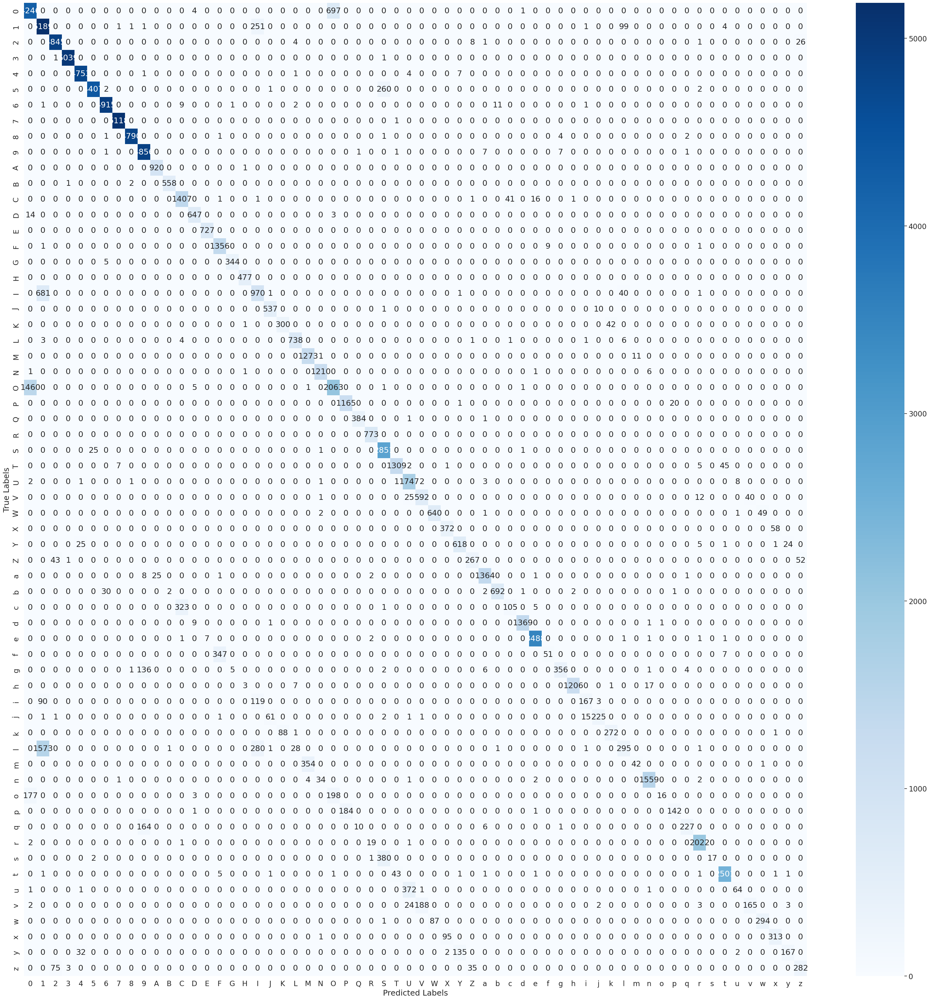

In [ ]:
# Visualise VGGNet's confusion matrix on the training set
confusion_matrix_viz(metrics[1][-1])

In [ ]:
# Compute the model performance on the test set
metrics_test = multi_evaluate(models, test_loader)
metrics_test_ = [metrics_test[i][:-1] for i in range(len(metrics_test))]
metrics_test_ = list(map(list, zip(*metrics_test_)))
# Store the results in Pandas DataFrame for readability
df_metrics_test = pd.DataFrame(metrics_test_,
                         index=['Accuracy', 'Precision', 'Recall', 'F1 Score'],
                         columns=['AlexNet', 'VGGNet', 'SpinalNet', 'ResNet'])
df_metrics_test = df_metrics_test.round(4)
df_metrics_test = df_metrics_test.applymap(lambda x: f'{x * 100:.2f}%')
df_metrics_test

,AlexNet,VGGNet,SpinalNet,ResNet
Accuracy,86.97%,87.24%,85.92%,86.88%
Precision,85.67%,86.42%,84.66%,86.00%
Recall,86.97%,87.24%,85.92%,86.88%
F1 Score,85.58%,85.65%,84.07%,85.67%


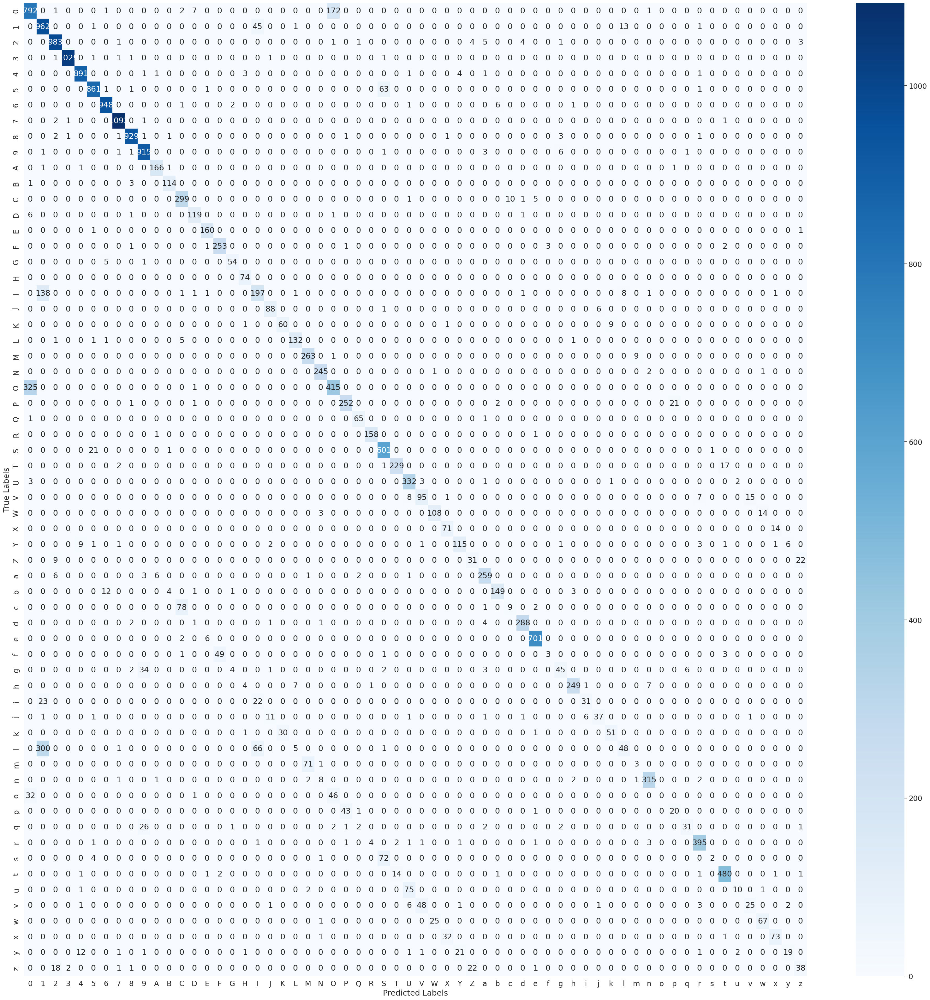

In [ ]:
# Visualise VGGNet's confusion matrix on the test set
confusion_matrix_viz(metrics_test[1][-1])

### Prediction of the optimal model

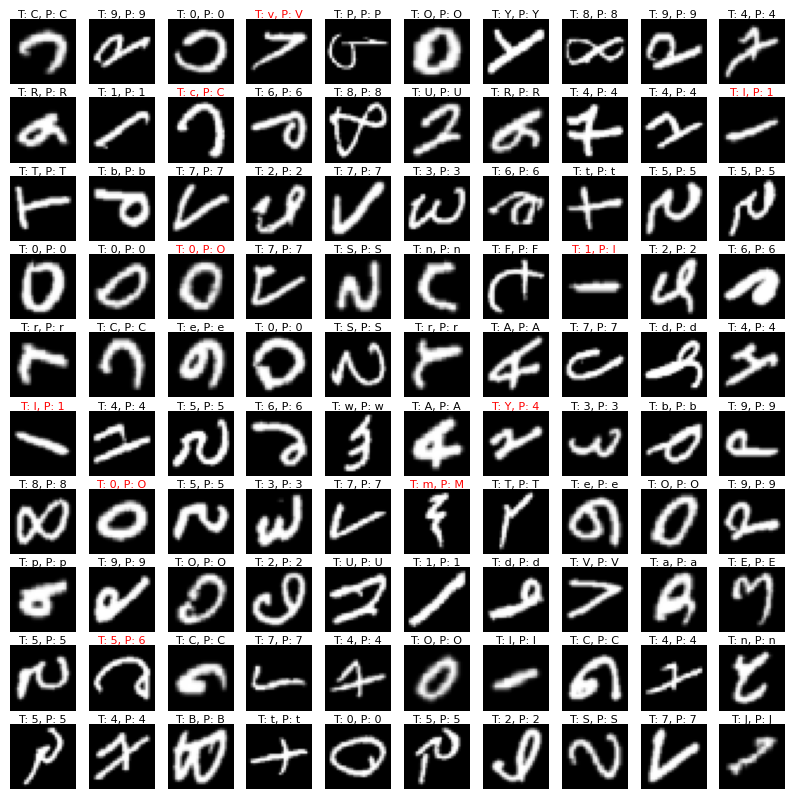

In [ ]:
predict_visualise(vggnet, test_loader)

## Evaluation on the complete datasets(optional)

In [ ]:
# Define the transformation of the images
transform = transforms.Compose([transforms.Resize(28),
                                transforms.ToTensor(),
                                transforms.Normalize((mean,), (std,)),
                                ])
# Load the EMNIST dataset
# The procedure requires downloading datasets.
# Please note, this process may take several minutes and could consume a significant amount of disk space.
emnist_train_complete = datasets.EMNIST(root='./EMNIST',split='byclass', train=True, download=True, transform=transform)
emnist_test_complete = datasets.EMNIST(root='./EMNIST', split='byclass', train=False, download=True, transform=transform)

100%|██████████| 561753746/561753746 [00:56<00:00, 9949168.08it/s]


Extracting ./EMNIST/EMNIST/raw/gzip.zip to ./EMNIST/EMNIST/raw


Accuracy on the training set: 87.61%.
Precision on the training set: 86.95%.
Recall on the training set: 87.61%.
F1 Score on the training set: 86.06%.
Accuracy on the test set: 87.22%.
Precision on the test set: 86.51%.
Recall on the test set: 87.22%.
F1 Score on the test set: 85.65%.


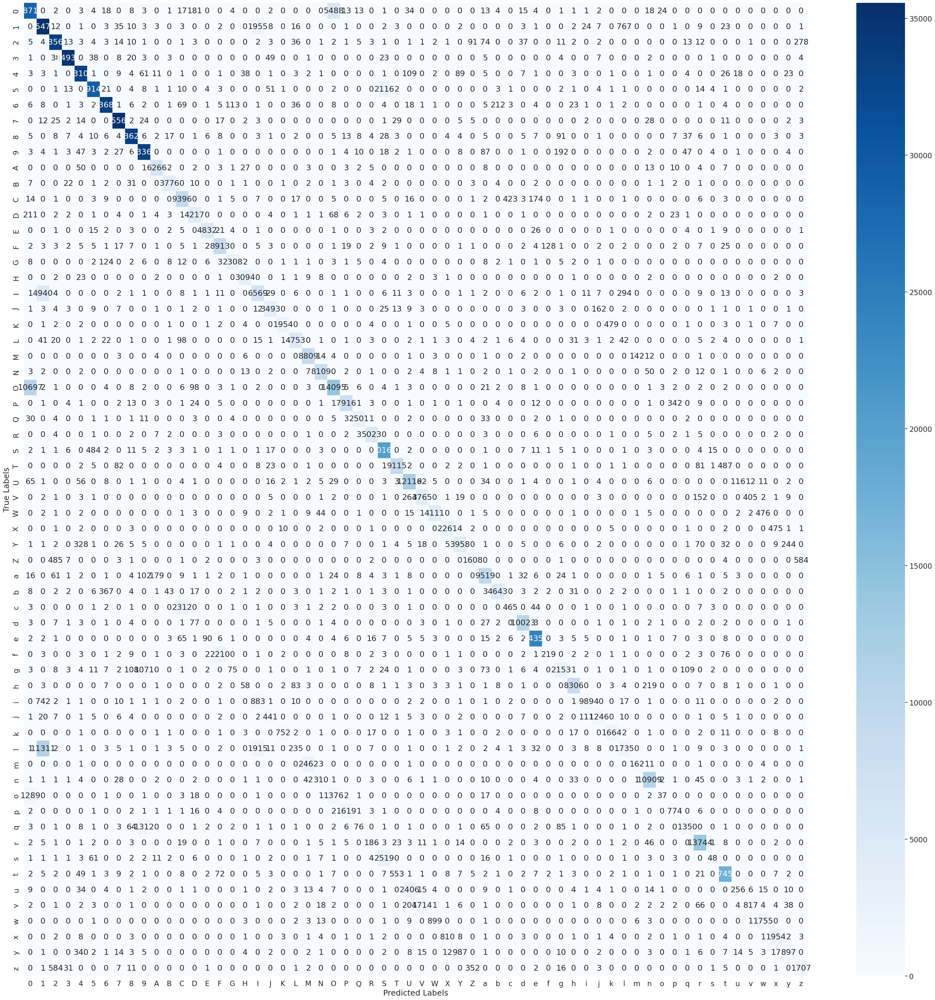

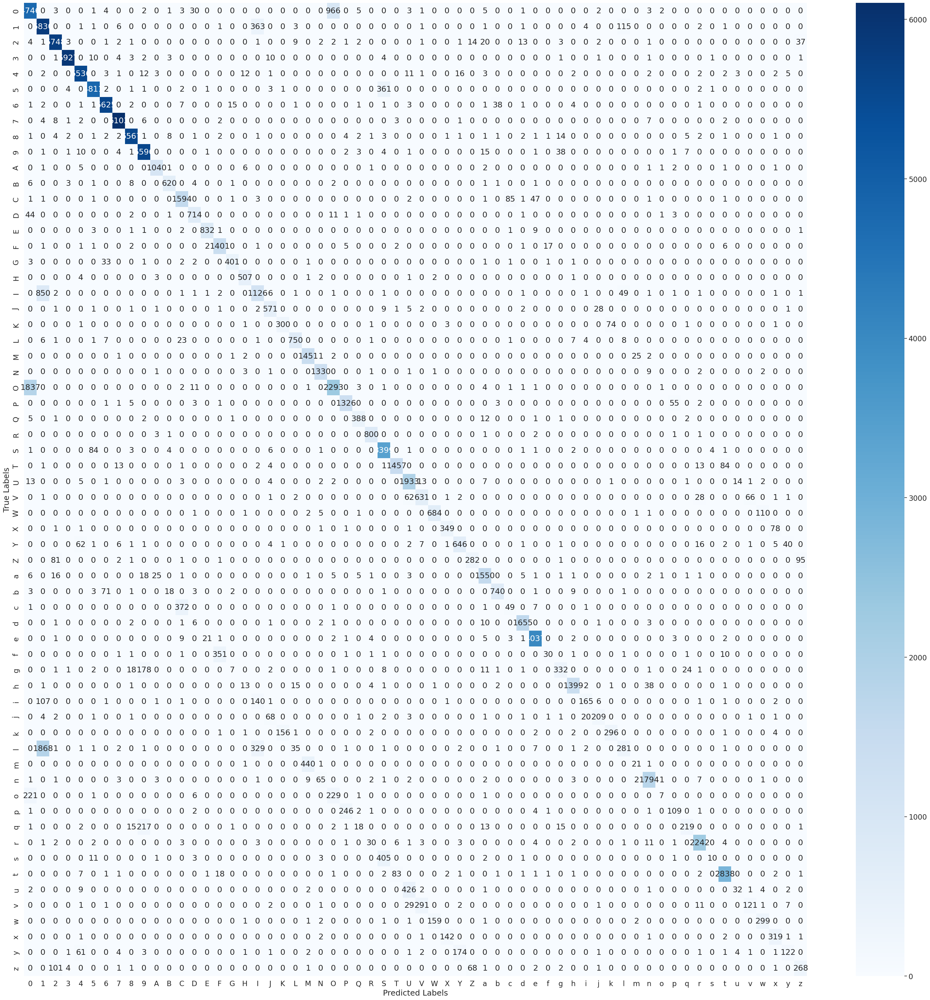

In [ ]:
# Given the size of the complete datasets, this snippet may take several minutes.
complete_train = DataLoader(emnist_train_complete, batch_size=100, shuffle=False, num_workers=2)
complete_test = DataLoader(emnist_test_complete, batch_size=100, shuffle=False, num_workers=2)
acc_train, precision_train, recall_train, f1_train, cm_train = evaluate(vggnet, complete_train)
acc_test, precision_test, recall_test, f1_test, cm_test = evaluate(vggnet, complete_test)
print(f"Accuracy on the training set: {acc_train*100:.2f}%.")
print(f"Precision on the training set: {precision_train*100:.2f}%.")
print(f"Recall on the training set: {recall_train*100:.2f}%.")
print(f"F1 Score on the training set: {f1_train*100:.2f}%.")
print(f"Accuracy on the test set: {acc_test*100:.2f}%.")
print(f"Precision on the test set: {precision_test*100:.2f}%.")
print(f"Recall on the test set: {recall_test*100:.2f}%.")
print(f"F1 Score on the test set: {f1_test*100:.2f}%.")
confusion_matrix_viz(cm_train)
confusion_matrix_viz(cm_test)